# Are Country's Undernourishment Rates Predictable?
__Group 15__ | Authors : Adithya Santhosh Kumar (6231292), Adli Luthfi (6140548), Thunchanok Phutthaphaiboon (6141153)

---

## Introduction

Despite global efforts to eradicate malnutrition and hunger, undernourishment remains a prevalent and alarming issue in many developing countries, hindering humanity’s progress toward achieving “Zero Hunger” as envisioned by Sustainable Development Goal 2 (SDG 2) formulated by the United Nations. The causes of hunger and malnutrition are manifold, ranging from socioeconomic realities to geopolitical and environmental concerns that affect various nation-states. Thus, critical indicators like population growth, GDP per capita, and access to basic amenities such as clean drinking water, food, and cooking fuel significantly influence undernourishment levels in a country. However, ascertaining the scale of these factors' impact on malnutrition levels is a complex and challenging policy conundrum.

This report, therefore, attempts to tackle the wicked and multifaceted research question: How do political, social, and economic factors influence undernourishment levels across countries? How do countries at different income levels (as shown in Figure 1) experience varying impacts from these factors? And to what extent can a computational and machine learning model aid in predicting and addressing these issues in alignment with the objectives of SDG 2?

Figure 1: Country classification by income level <br>
Please note that, this figure is plotted using Plotly library. The code to create this plot is in mapplot.ipynb.
![image](country_classification_by_income_level.png)

## Datasets

The analysis relies on data from the following sources:
1. __World Bank Data Portal__ <br>
The World Bank Data Portal (World Bank Open Data, n.d.) offers comprehensive global economic and social statistics, including World Development Indicators, International Debt Statistics, Millennium Development Indicators, and data on sustainable development goals (SDGs). For this analysis, we acquired time series data on the following indicators:
- Prevalence of undernourishment (% of population)
- Access to clean fuels and technologies for cooking (% of population)
- People using at least basic drinking water services (% of population)
- Population growth (annual %)
- Income share held by highest 10%
- Income share held by lowest 20%
- Food production index (2014-2016 = 100)
- Cereal production (metric tons)
- GDP per capita, PPP (current international $)
- Control of Corruption: Estimate
- Economic and Social Rights Performance Score
These indicators are extensively analyzed and some are incorporated as inputs in the predictive model.

2. __Our World in Data__ <br>
Our World in Data is a project of the Global Change Data Lab, a non-profit organization based in the United Kingdom. The time series data sourced from this project pertain to the daily calorie supply per person across various countries (Our World in Data, 2023). Originally from the Food and Agriculture Organization (FAO), this dataset has been preprocessed by Our World in Data and serves as a crucial input in the predictive modeling stage.

<br><br><br>

## Data Import

This section covers the loading of data from two primary sources to explore the relationship between the prevalence of undernourishment and various indicators across different income groups. The main data source, World Bank data, is managed separately for each income group to enable focused analysis. A custom class, __WorldBankData__, was developed to facilitate data exploration, with the following key methods:

- __load_ts_wb_data(self, countries, indicator_dict)__: Loads datasets from the World Bank portal using metadata, allowing for the import of specific indicators across multiple countries.

- __plot_ts_byindicator(self, indi_code, x_label="Year", y_label="Value")__: This function aids in exploring time series data by plotting each country’s indicator values over time. Its utility is particularly highlighted in the analysis of High Income Countries (HIC).

- __merged_country_data(self, country)__: Although not used directly in this analysis, this function supports exploring multiple indicators for a specific country, allowing for more detailed, country-level analysis.

- __check_correlation(self)__: Utilizes the Pandas correlation function to generate a correlation matrix of all indicators within the WorldBankData object, helping to quantify relationships between variables.

- __calculate_average_overtime(self, indi_code)__: Calculates the average values of an indicator over time for all countries in the specified income group. This method supports overall trend analysis, as demonstrated in the creation of Figure 2 later in the report.

In addition to World Bank data, preprocessed daily calorie supply data from __Our World in Data__ is also imported as a CSV file to complement the analysis with additional context.

In [3]:
# Import libraries
from IPython.core.display import Image
import wbdata
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import pycountry

print("Versions of Imported Modules")
print("wbdata", wbdata.__version__)
print("tensorflow", tf.__version__)
print("numpy", np.__version__)
print("pandas", pd.__version__)
print("seaborn", sns.__version__)
print("pycountry", pycountry.__version__)

Versions of Imported Modules
wbdata 1.0.0
tensorflow 2.17.1
numpy 1.26.4
pandas 2.2.3
seaborn 0.14.0.dev0
pycountry 24.6.1


### Source 1: World Bank Data

In [5]:
class WorldBankData:
    def __init__(self):
        self.wb_df_dict = {}
        self.wb_name_dict = {}
        self.wb_df_bycountry_dict = {}

    # Load and process time series data (ONE indicator, MULTIPLE countries)
    def load_ts_wb_data(self, countries, indicator_dict):
        one_indicator = indicator_dict # wbdata's syntax
        self.countries = countries
        for i in one_indicator:
            self.wb_name_dict[i] = one_indicator[i]
        df = wbdata.get_dataframe(one_indicator, country=countries, parse_dates=True)
        # Reset the index to convert the MultiIndex to normal columns
        df_reset = df.reset_index()
        # Pivot the DataFrame so that each country gets its own column for the income data
        column_names = df_reset.columns
        df_pivoted = df_reset.pivot(index='date', columns='country', values=column_names[-1])
        # Reset the index again to remove the date as an index and convert it to a normal column
        df_pivoted_reset = df_pivoted.reset_index()
        # Rename the columns for clarity
        df_pivoted_reset.columns.name = None
        df_pivoted_reset.rename(columns={'date': 'Date'}, inplace=True)
        df_indicator = df_pivoted_reset
        for i in one_indicator:
            self.wb_df_dict[i] = df_pivoted_reset
        df_data = df_pivoted_reset
        return (df_data)

    # Plot time series data (ONE indicator, MULTIPLE countries)
    def plot_ts_byindicator(self, indi_code, x_label = "Year", y_label = "Value"):
        # Get column names of the DataFrame
        df = self.wb_df_dict[indi_code]
        column_names = df.columns
        # Plotting the line chart for all countries
        plt.figure(figsize=(10, 6))
        # Plot each country as a separate line in the line chart
        for country in df.columns[1:]:
            plt.plot(df['Date'], df[country], label=country)
        # Adding title and labels
        plt.title(self.wb_name_dict[indi_code])
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.legend(title='Country', fontsize=8)
        plt.grid(True)
        # Display the plot
        plt.show()

    def merge_country_data(self, country):
        # Initialize an empty DataFrame for storing merged data
        merged_df = pd.DataFrame()
        for key, df in self.wb_df_dict.items():
            # Filter the dataframe for the given country
            filtered_df = df[['Date', country]].copy()
            # Rename the country column to the key (which is descriptive of the indicator)
            filtered_df.rename(columns={country: self.wb_name_dict[key]}, inplace=True)
            # Merge with the existing merged DataFrame
            if merged_df.empty:
                merged_df = filtered_df
            else:
                merged_df = pd.merge(merged_df, filtered_df, on='Date', how='outer')
        # Sort values by date (optional, for easier reading)
        merged_df = merged_df.sort_values(by='Date')
        self.wb_df_bycountry_dict[country] = merged_df
        return (merged_df)
        
    def check_correlation(self):
        df = wbdata.get_dataframe(self.wb_name_dict, country=self.countries, parse_dates=True)
        correlation = df.sort_index().groupby('country').last().corr()
        return (correlation)

    def calculate_average_overtime(self, indi_code):
        # Access the DataFrame for the given indicator code
        df = self.wb_df_dict[indi_code]
        # Calculate the average across all countries for each year
        df['average'] = df.iloc[:, 1:].mean(axis=1)  # Exclude the datetime column (first column)
        # Create a new DataFrame with year and average columns
        result_df = df[['Date', 'average']]
        return result_df

#### World Bank Indicators

In [7]:
indicators = {'SN.ITK.DEFC.ZS': 'Prevalence of undernourishment (% of population)',
             'EG.CFT.ACCS.ZS': 'Access to clean fuels and technologies for cooking (% of population)',
             'SH.H2O.BASW.ZS': 'People using at least basic drinking water services (% of population)',
             'SP.POP.GROW': 'Population growth (annual %)',
             'SI.DST.10TH.10': 'Income share held by highest 10%',
             'SI.DST.FRST.20': 'Income share held by lowest 20%',
             'AG.PRD.FOOD.XD': 'Food production index (2014-2016 = 100)',
             'AG.PRD.CREL.MT': 'Cereal production (metric tons)',
             'NY.GDP.PCAP.PP.CD': 'GDP per capita, PPP (current international $)',
             'CC.EST': 'Control of Corruption: Estimate',
             'SD.ESR.PERF.XQ': 'Economic and Social Rights Performance Score'
             }

#### Load Data: High Income Countries (HIC)

High income level contains  85 countries.
To explore the dataset, 'plot_ts_byindicator' is called to plot the data of all countries in the class.


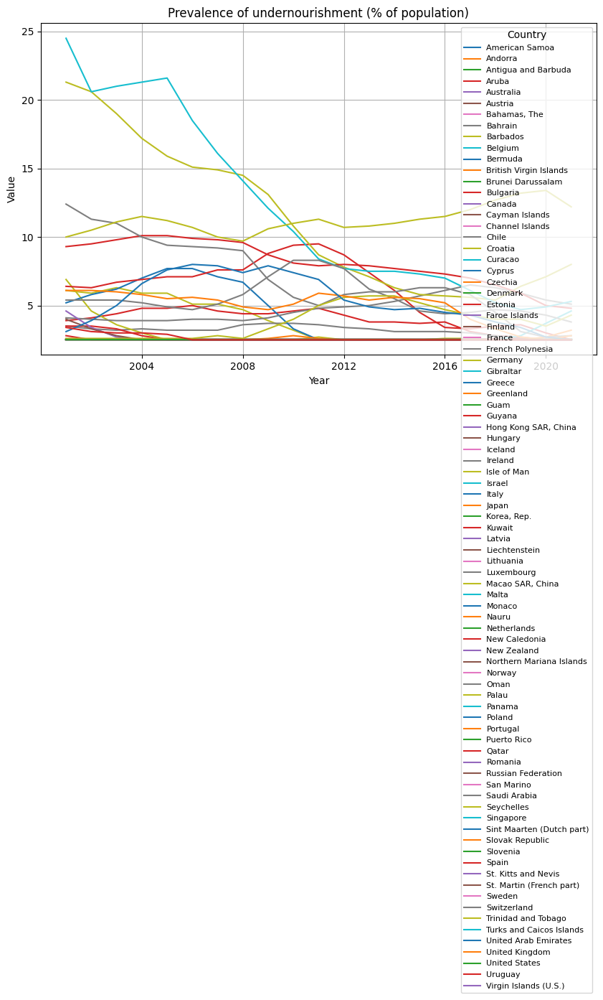

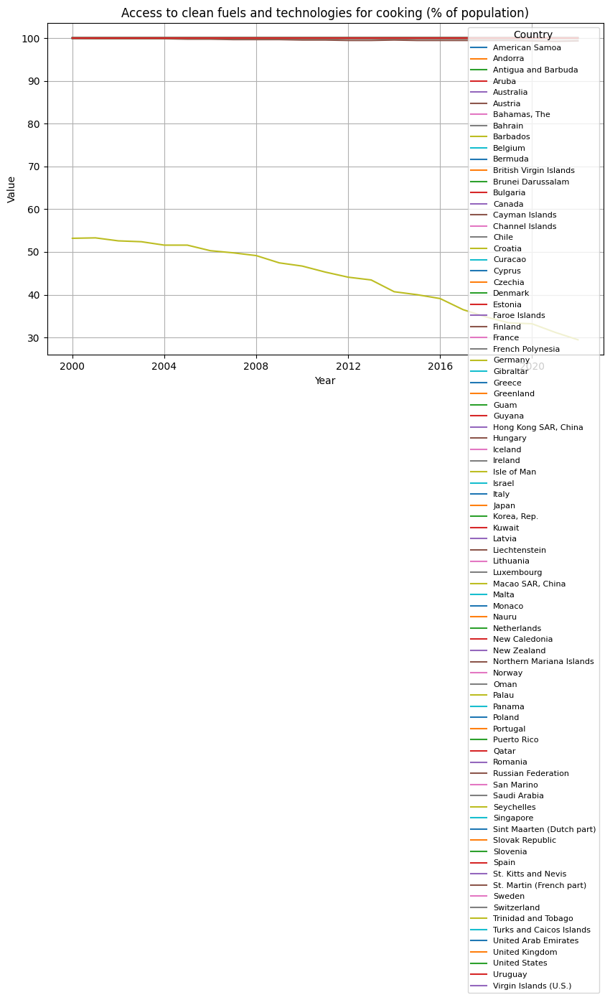

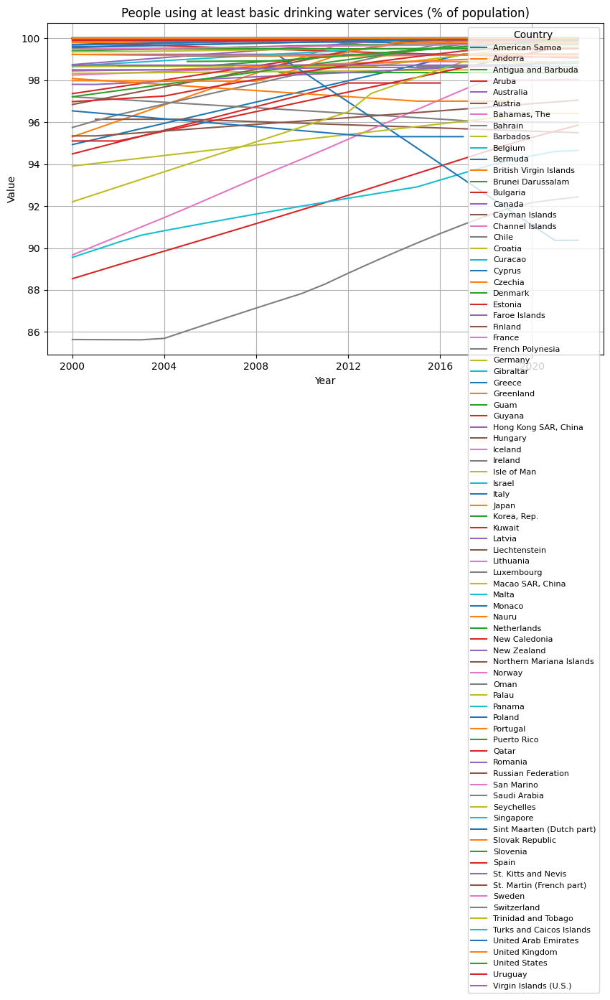

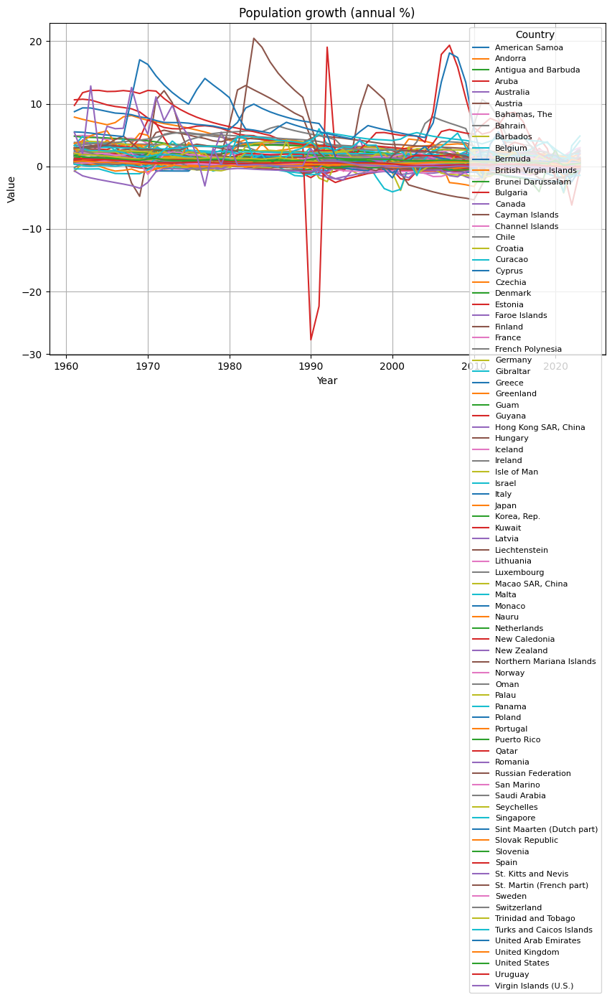

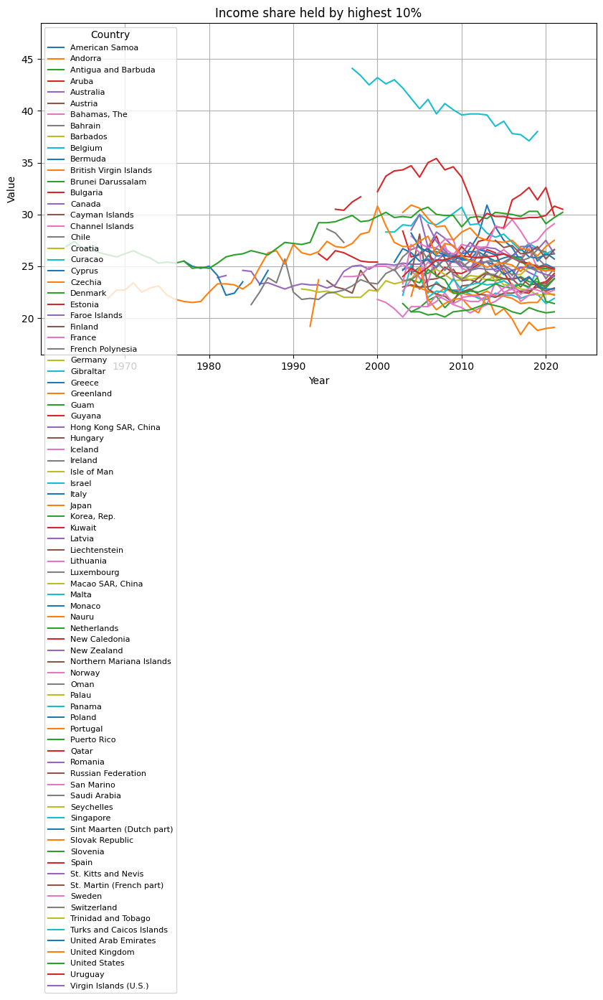

...

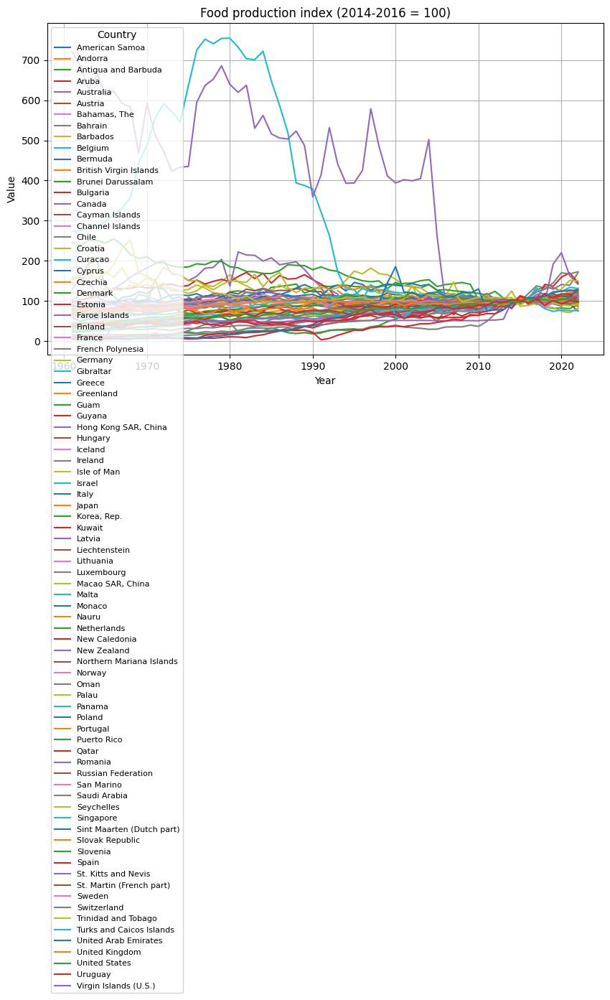

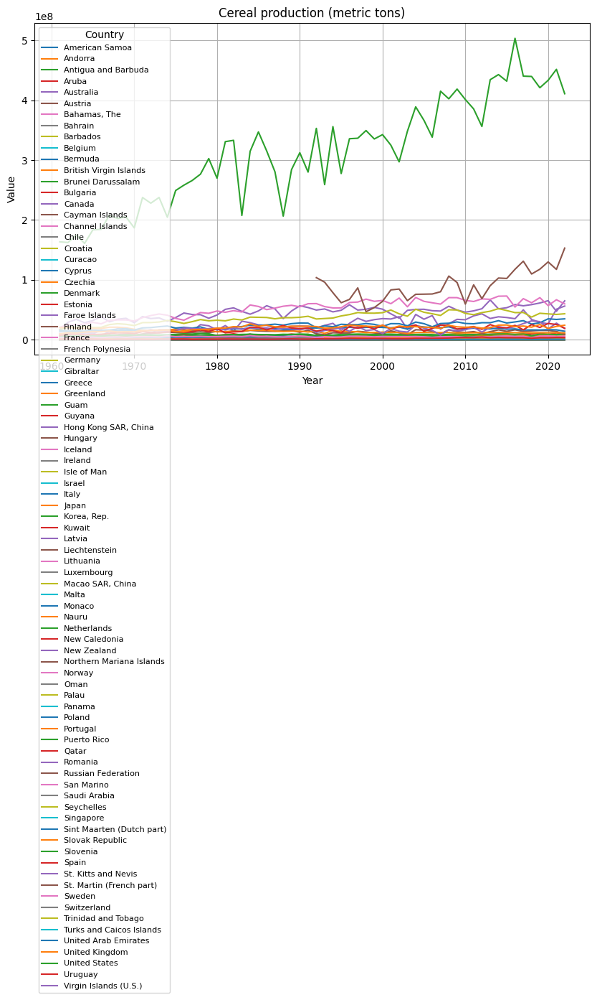

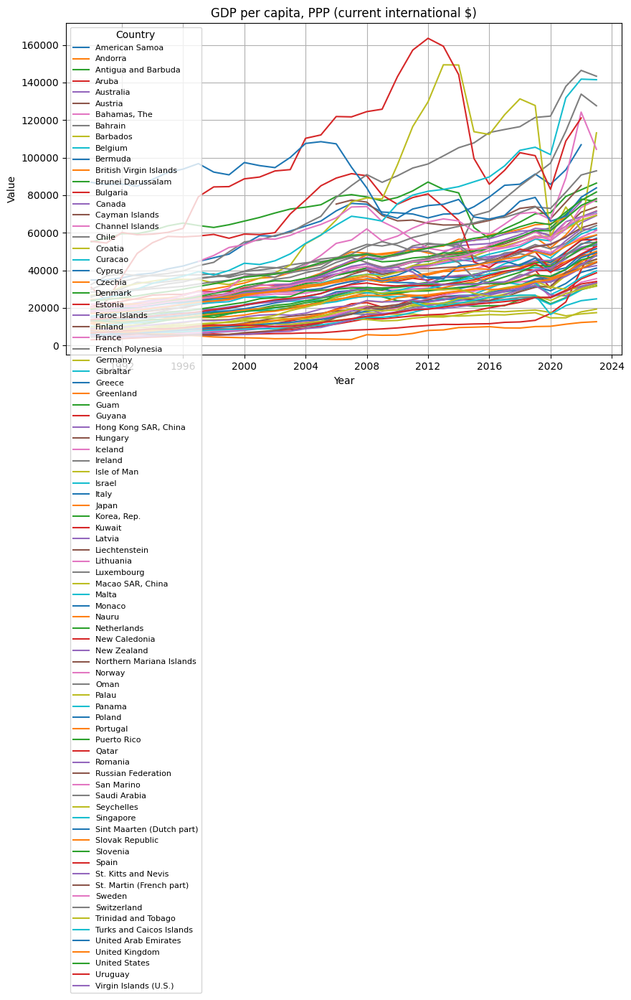

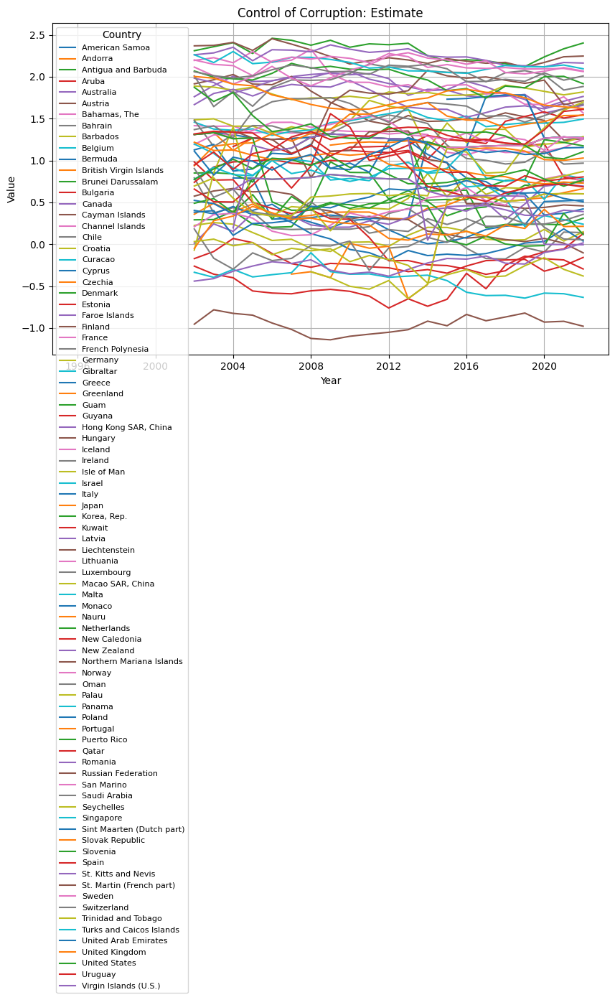

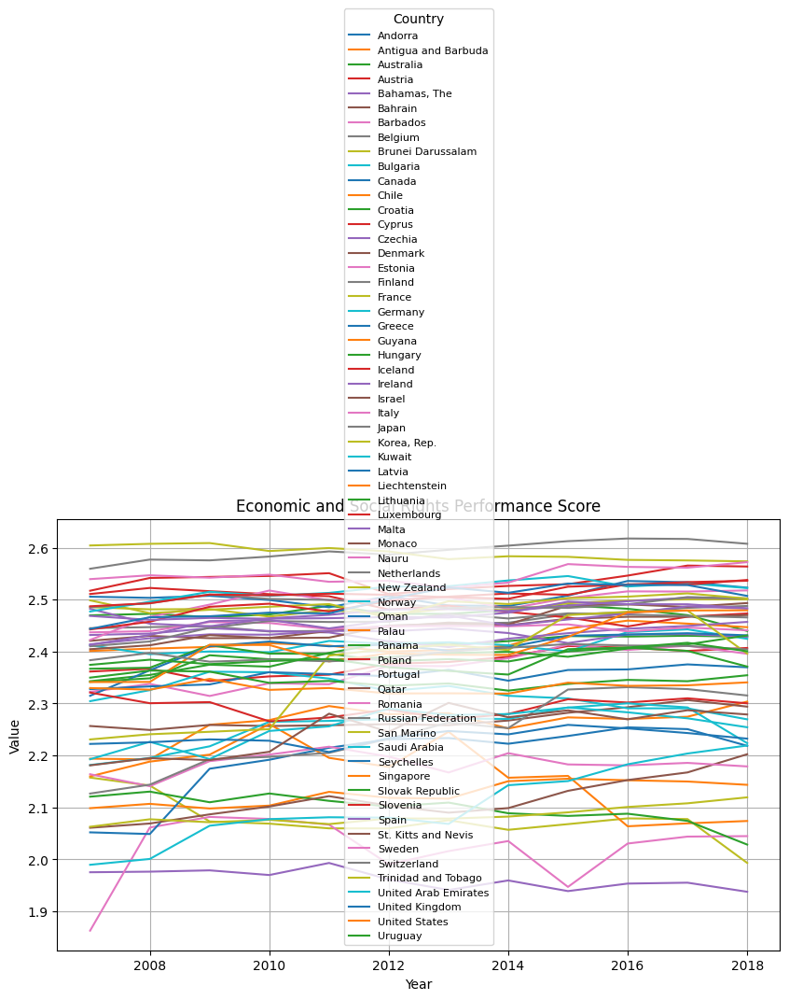

In [11]:
wb_data_HIC = WorldBankData()
HIC = [i['id'] for i in wbdata.get_countries(incomelevel='HIC')]
print("High income level contains ", len(HIC), "countries.")
print("To explore the dataset, 'plot_ts_byindicator' is called to plot the data of all countries in the class.")
for indi in indicators:
    wb_data_HIC.load_ts_wb_data(HIC, {indi:indicators[indi]})
    wb_data_HIC.plot_ts_byindicator(indi)

#### Load Data: Upper-middle Income Countries (UMC)

Upper-middle income level contains  54 countries.


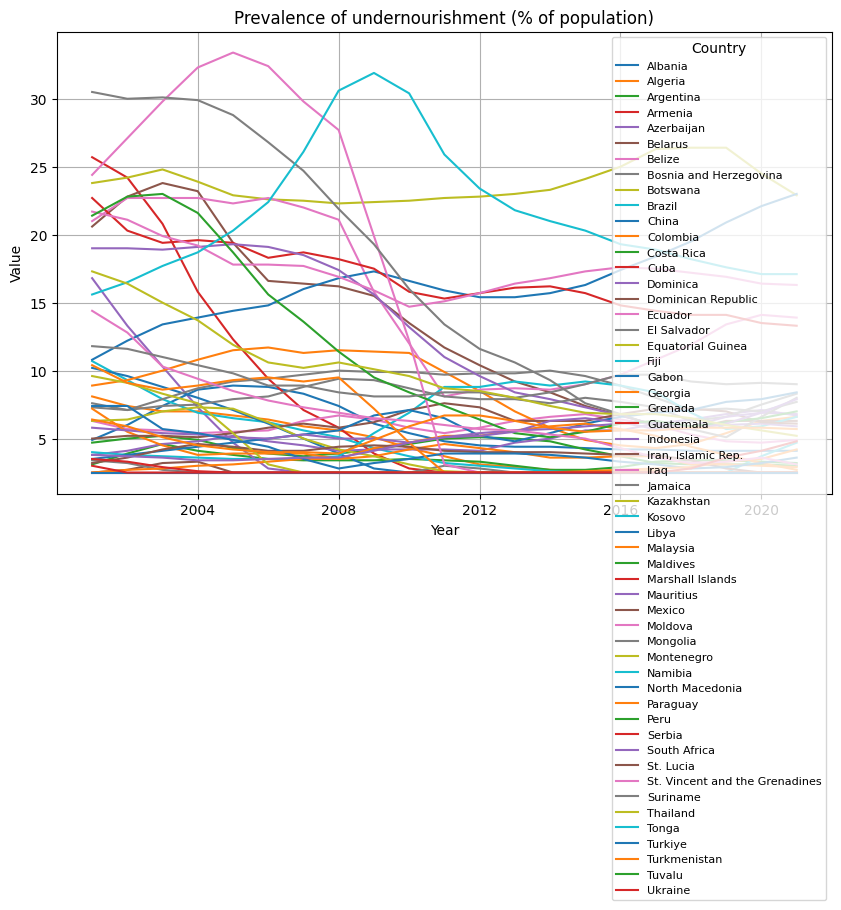

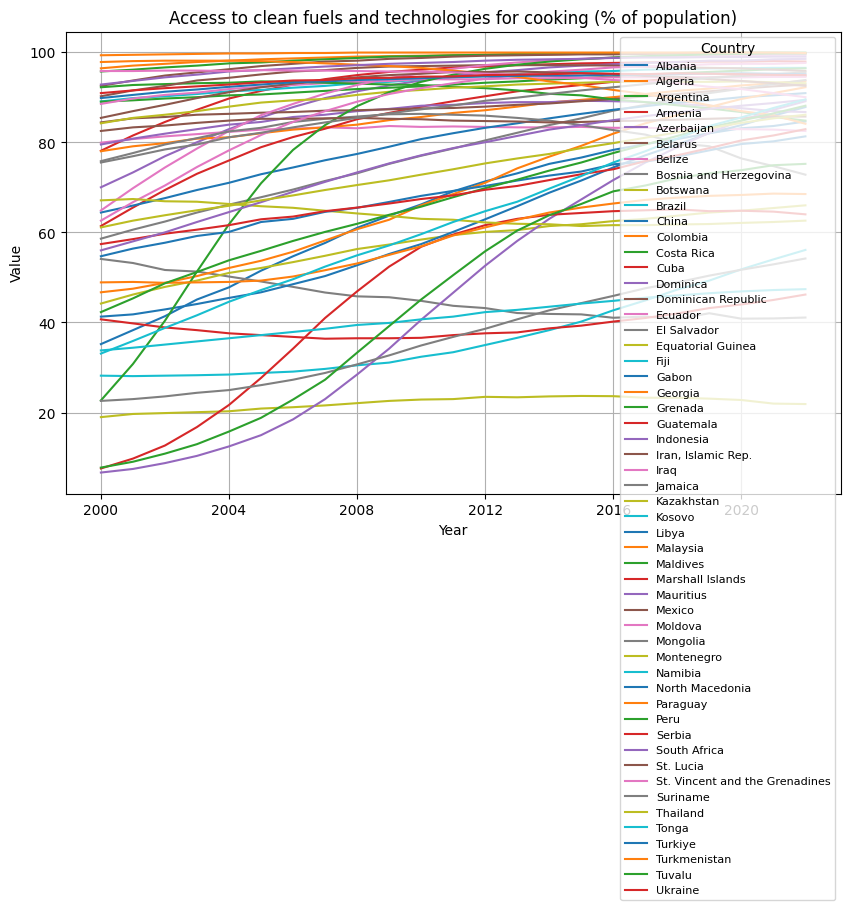

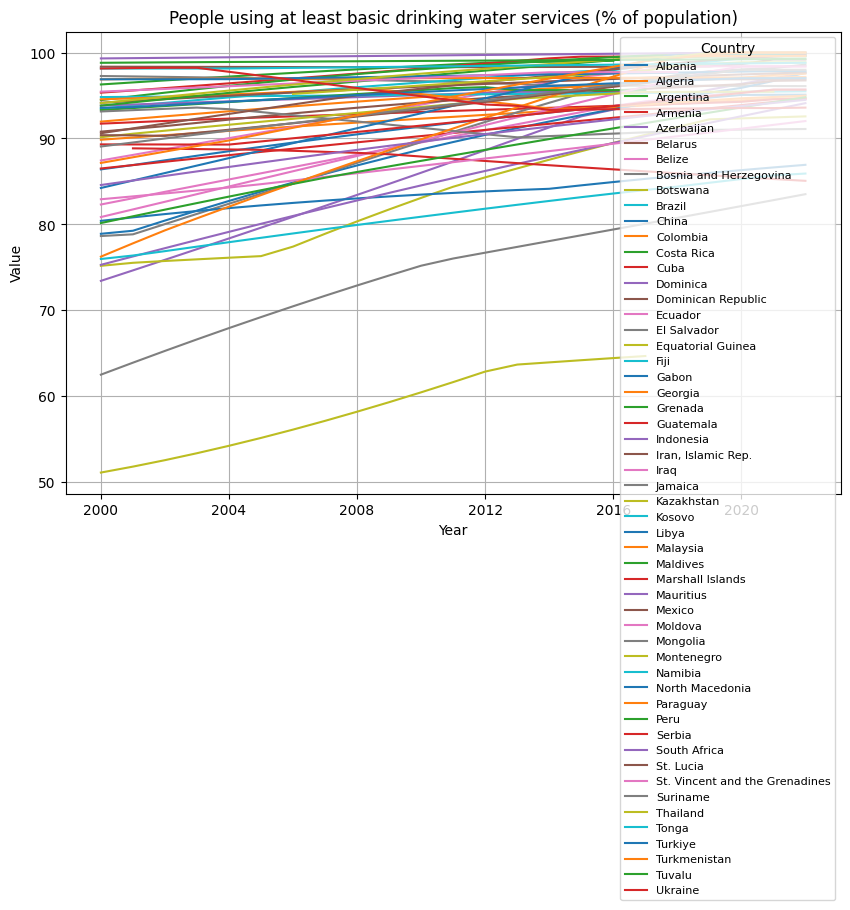

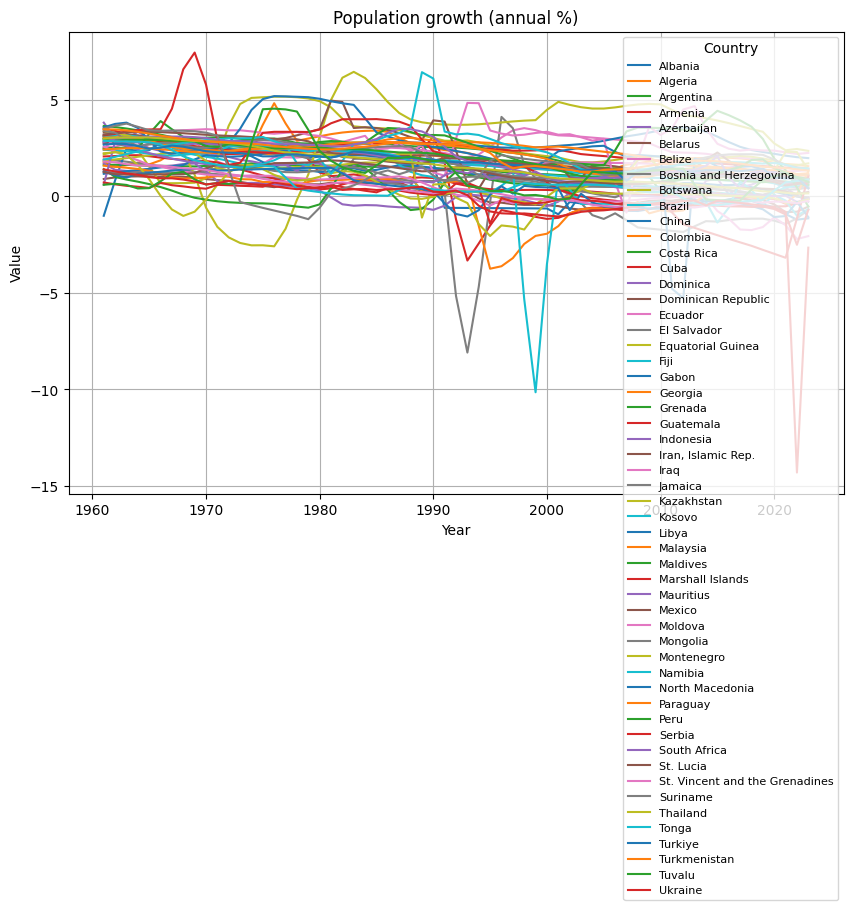

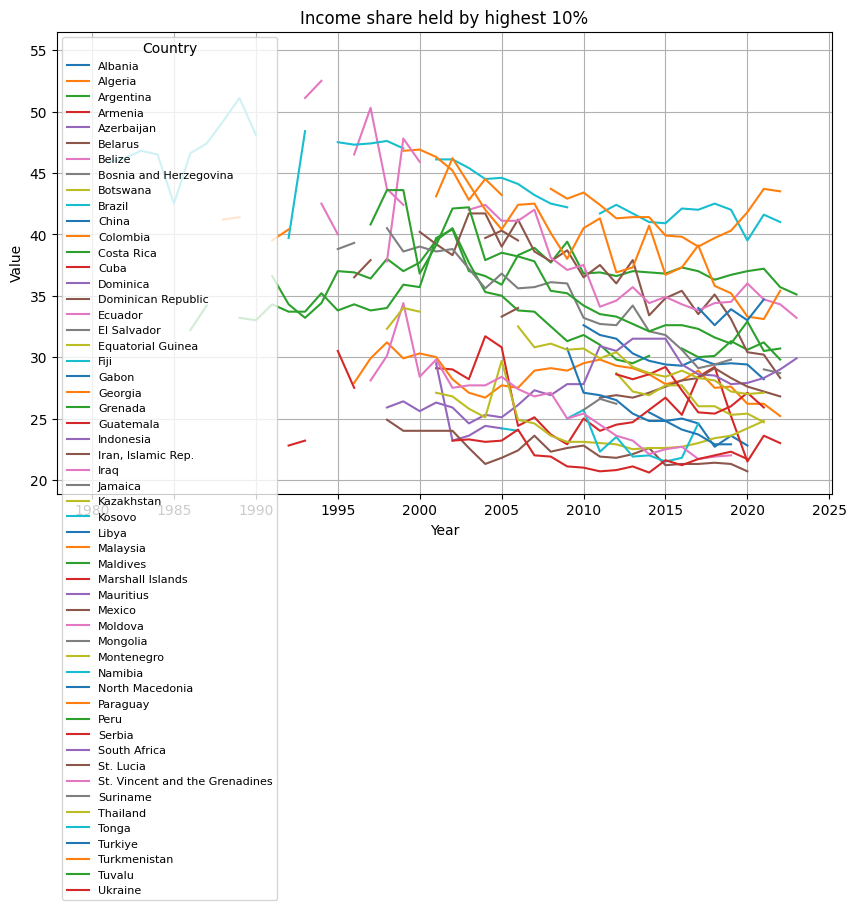

...

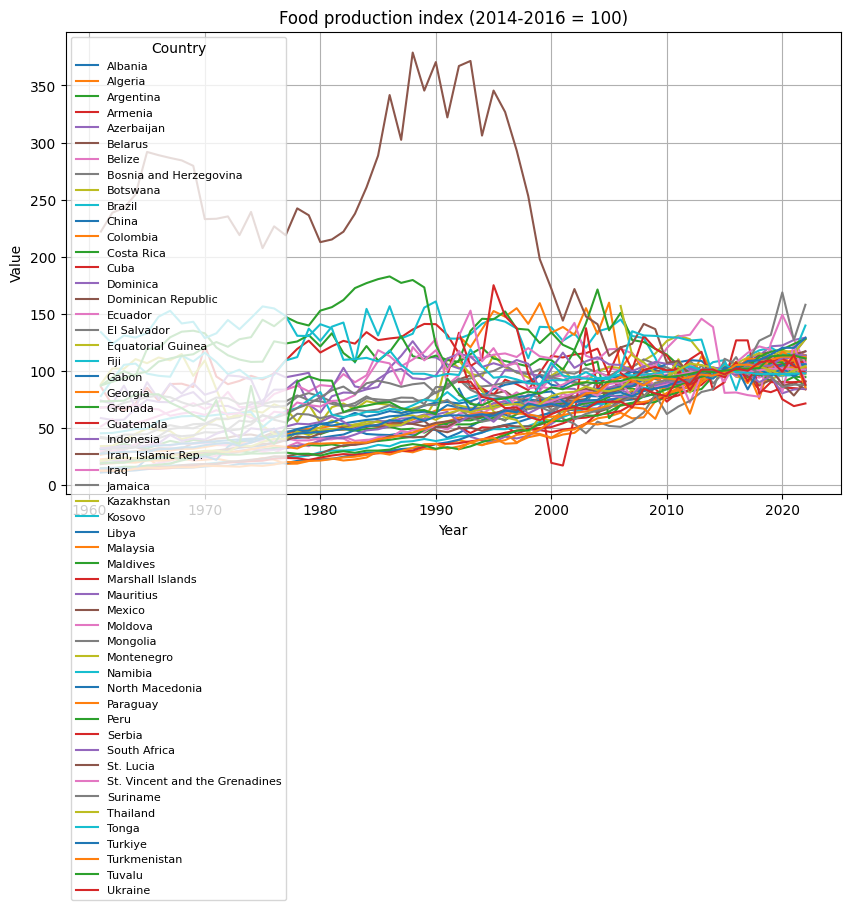

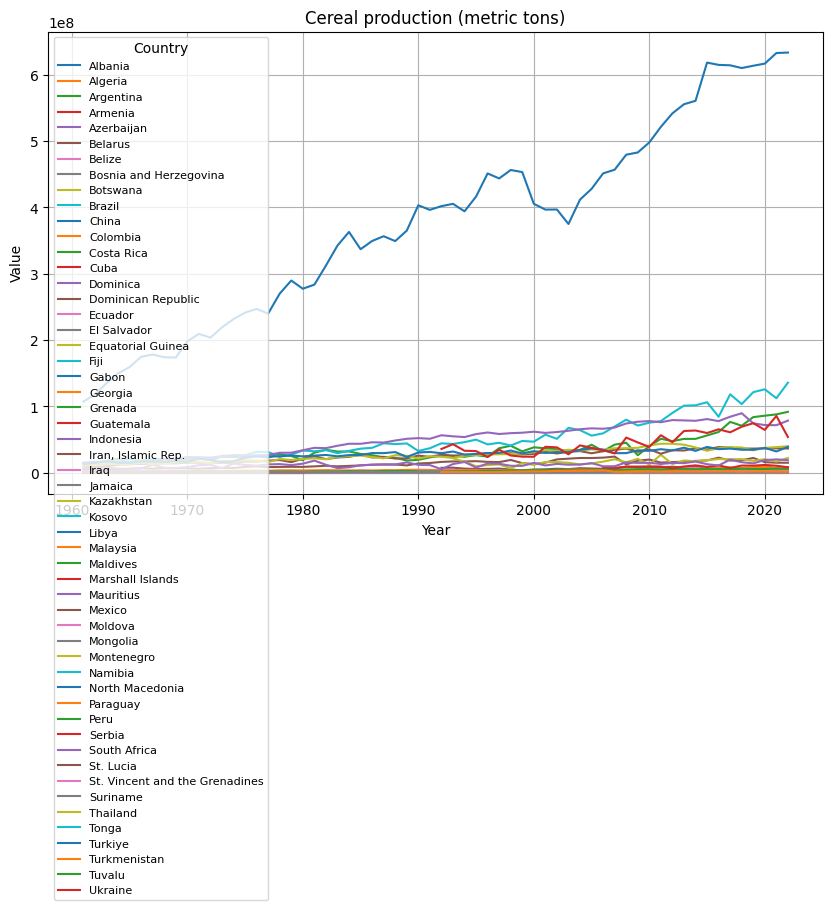

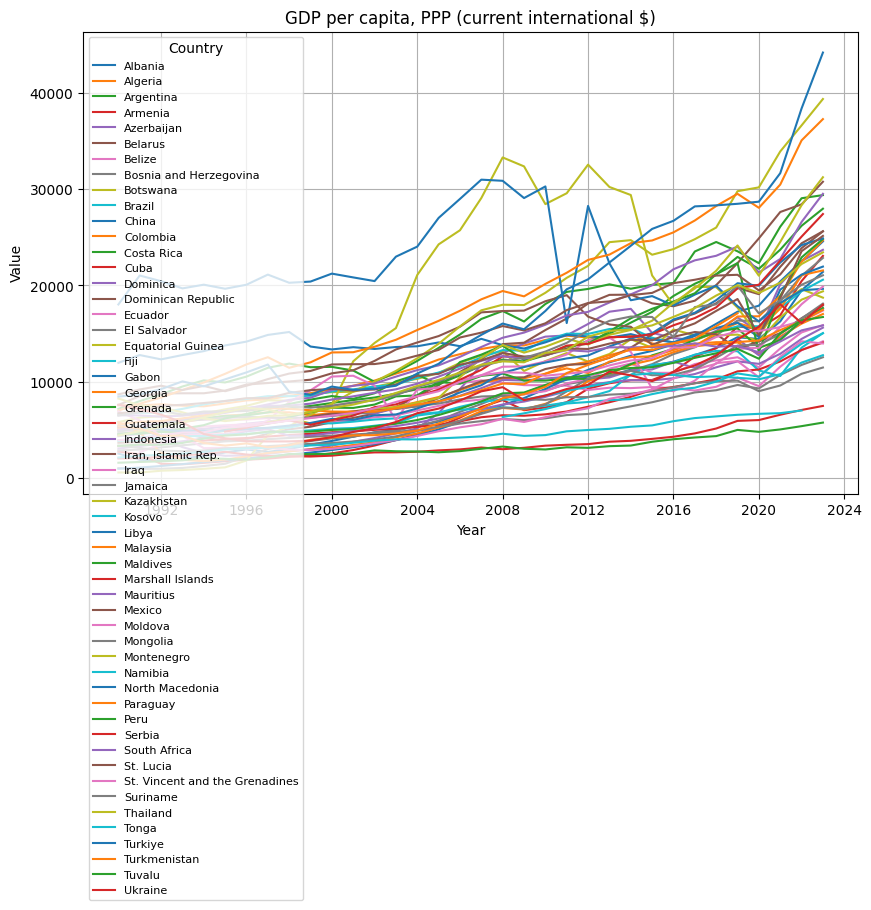

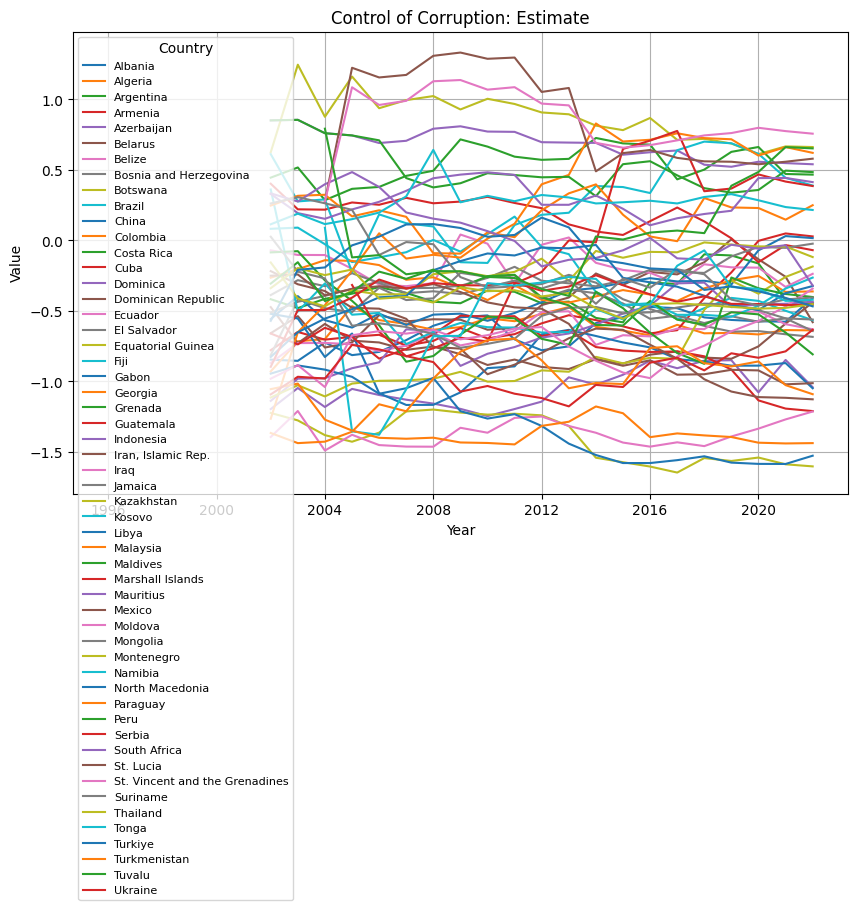

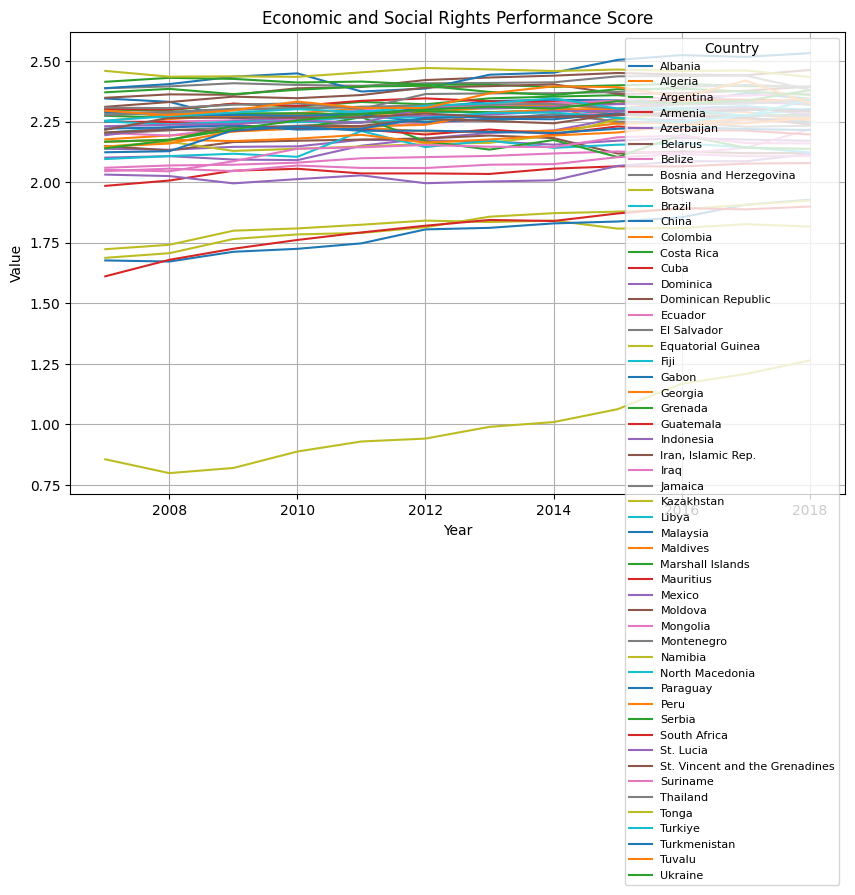

In [17]:
wb_data_UMC = WorldBankData()
UMC = [i['id'] for i in wbdata.get_countries(incomelevel='UMC')]
print("Upper-middle income level contains ", len(UMC), "countries.")
for indi in indicators:
    wb_data_UMC.load_ts_wb_data(UMC, {indi:indicators[indi]})
    wb_data_UMC.plot_ts_byindicator(indi)

#### Load Data: Lower-middle Income Countries (LMC)

Lowwer-middle income level contains  51 countries.


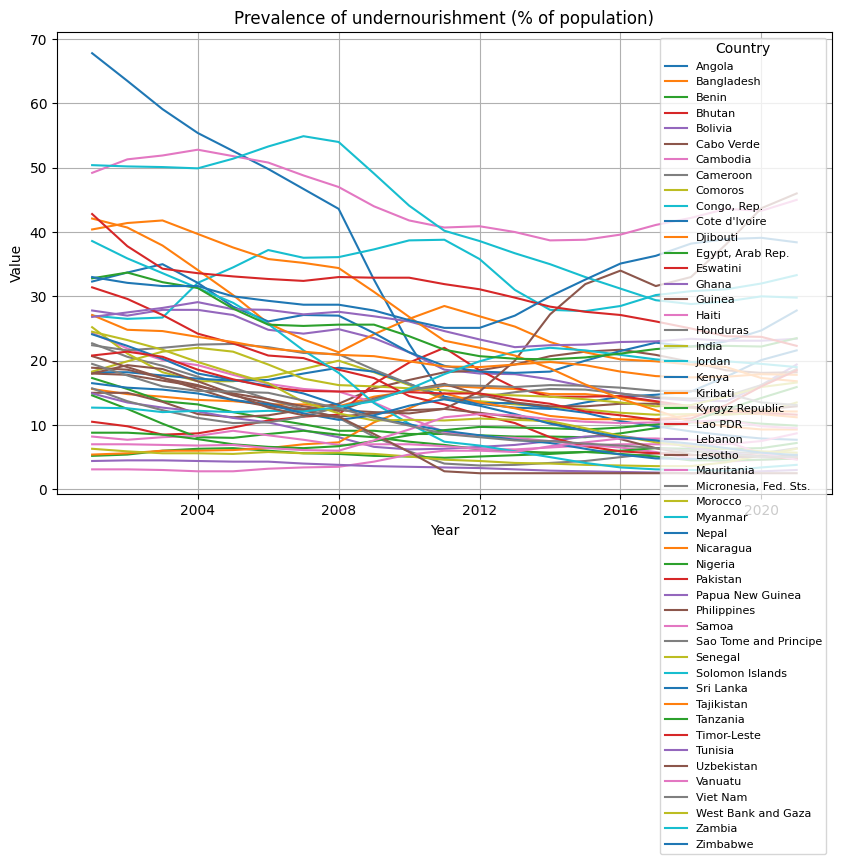

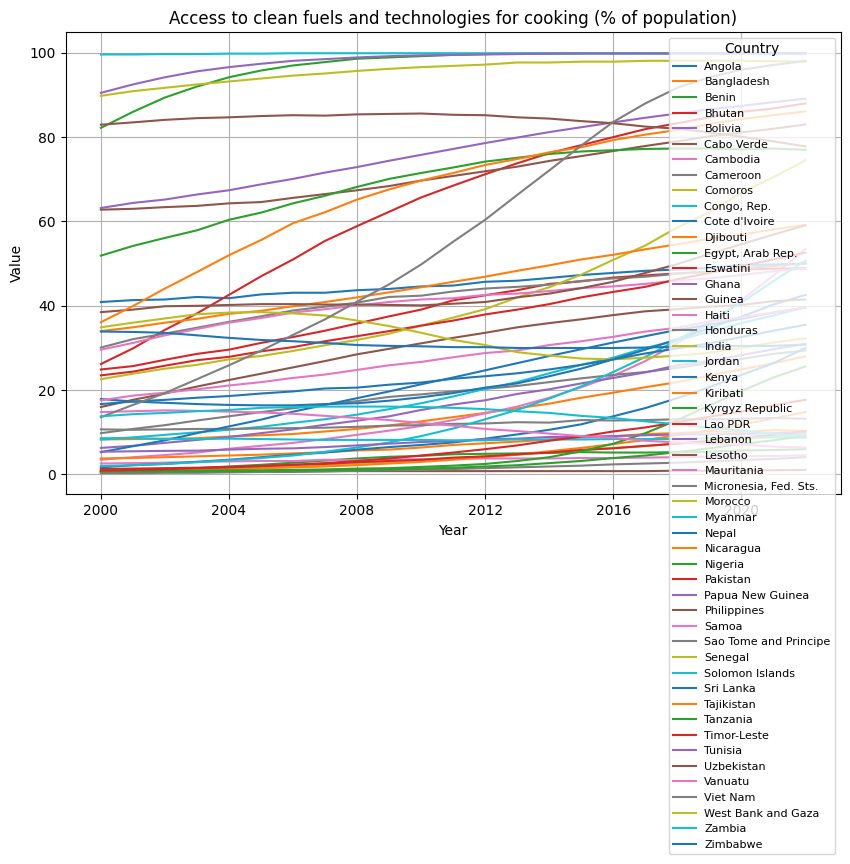

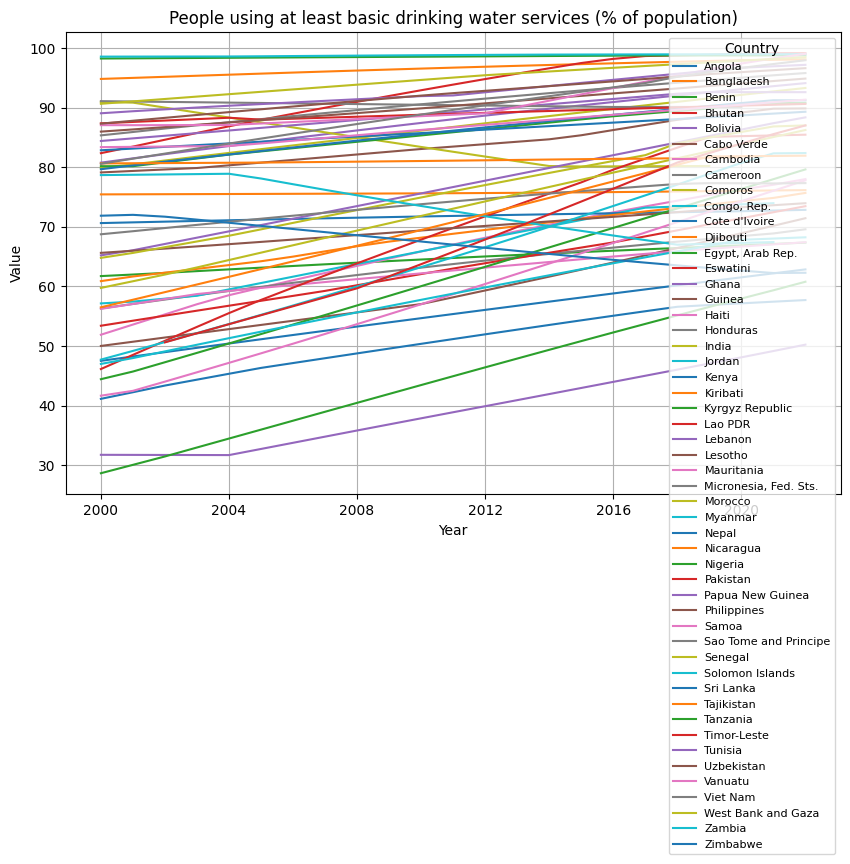

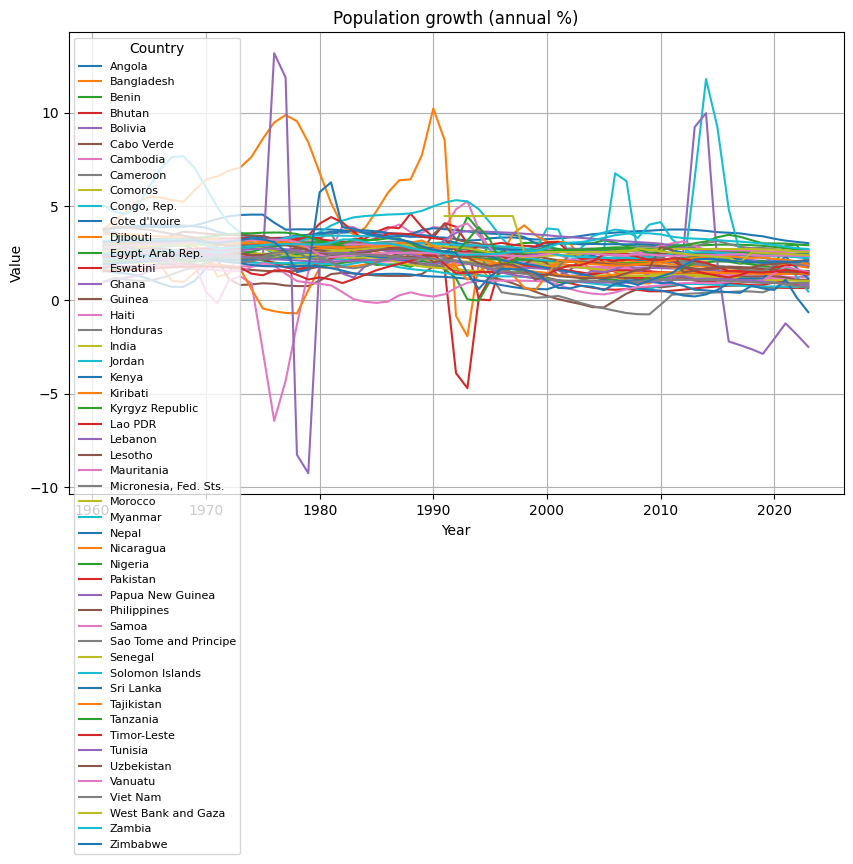

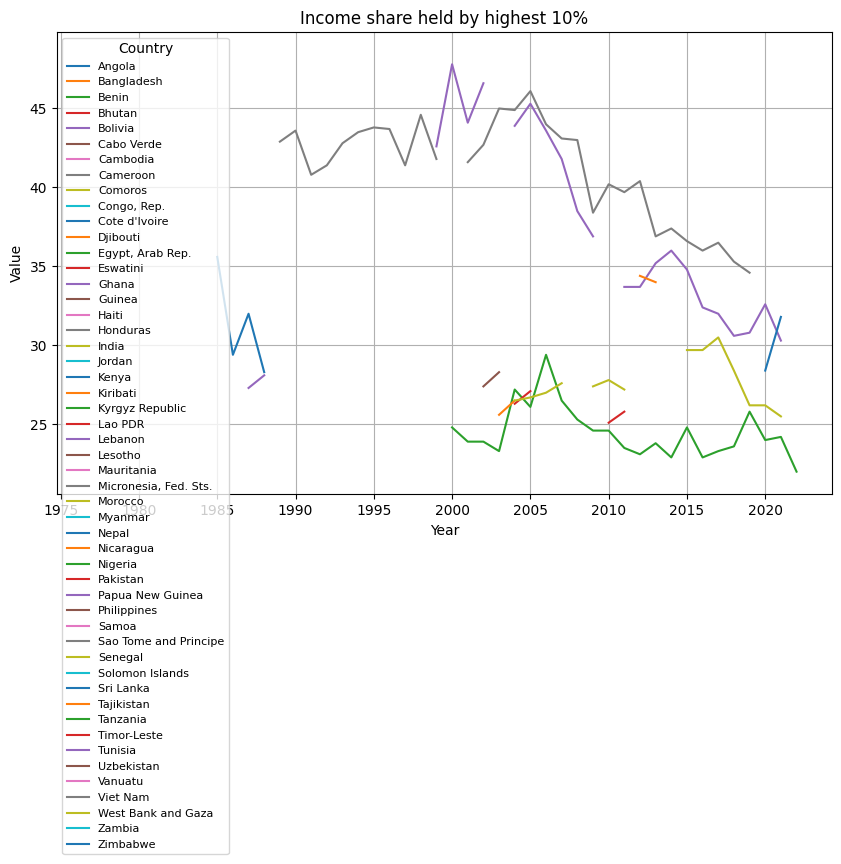

...

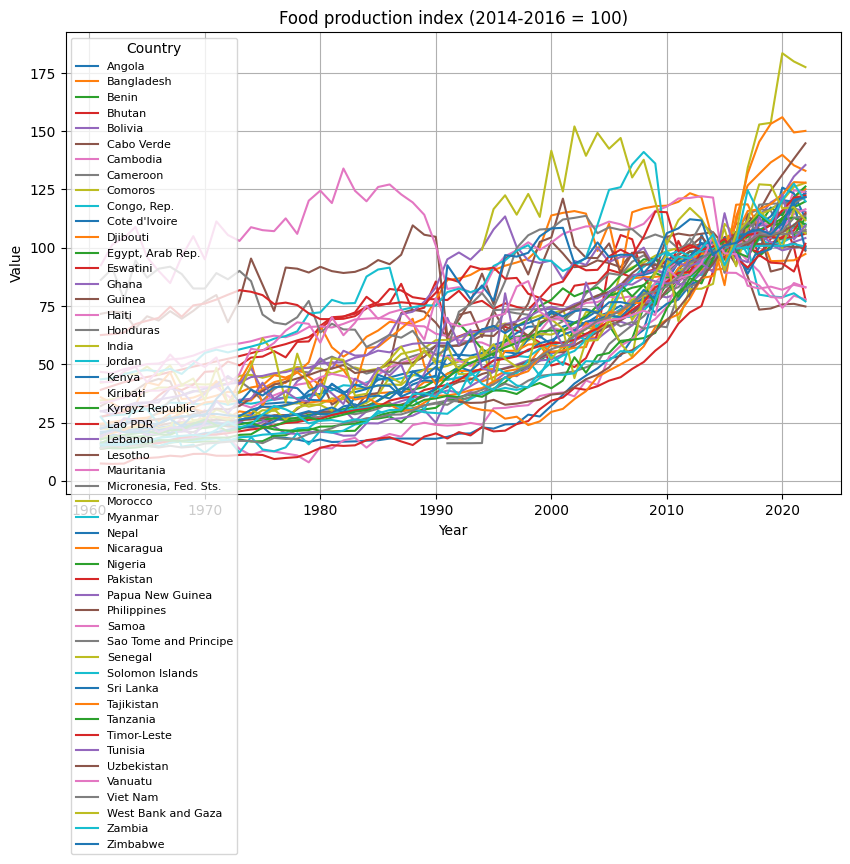

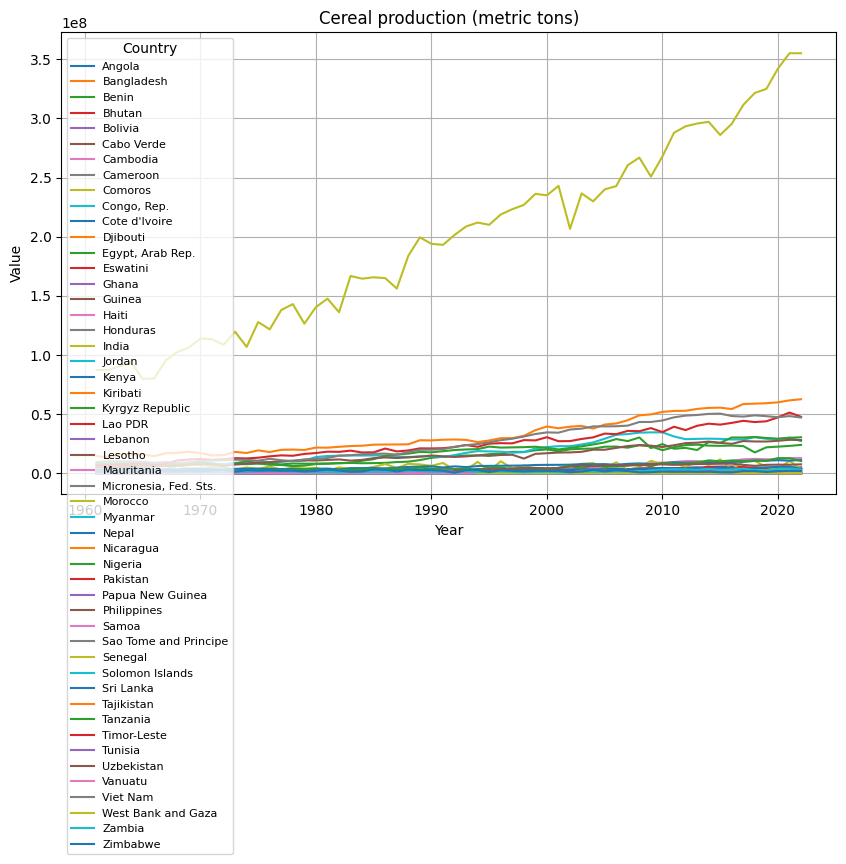

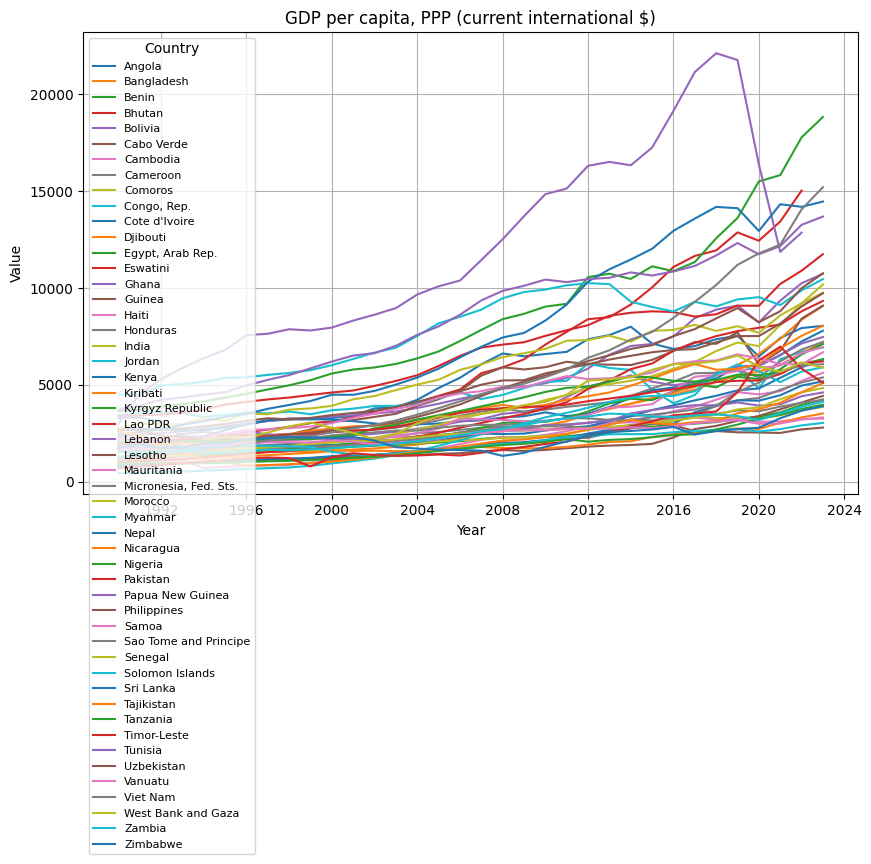

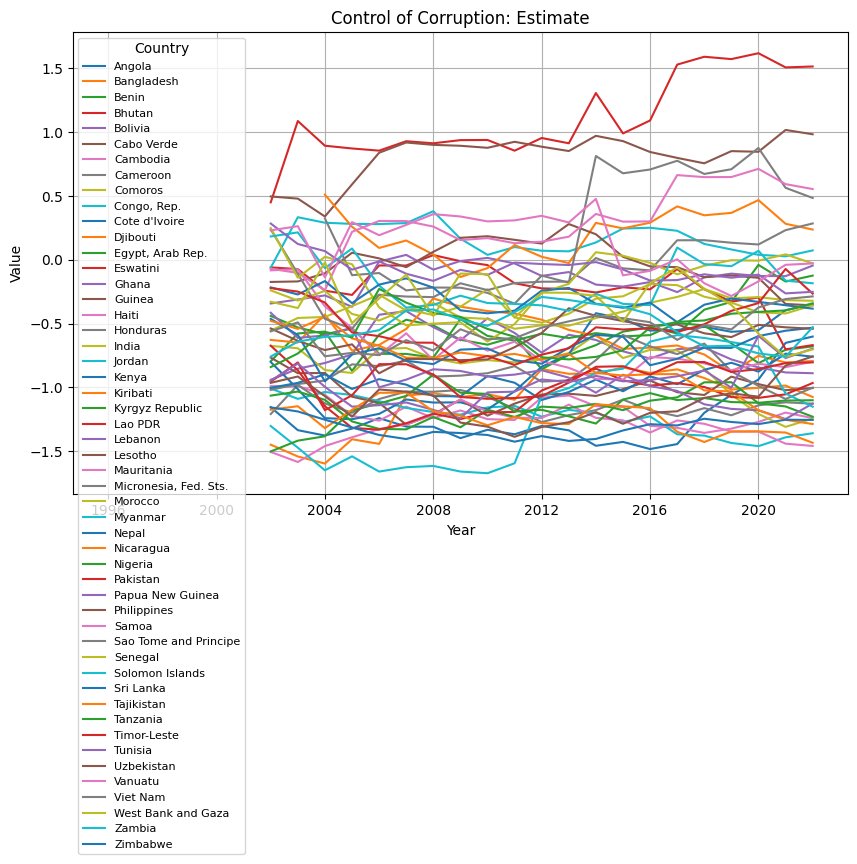

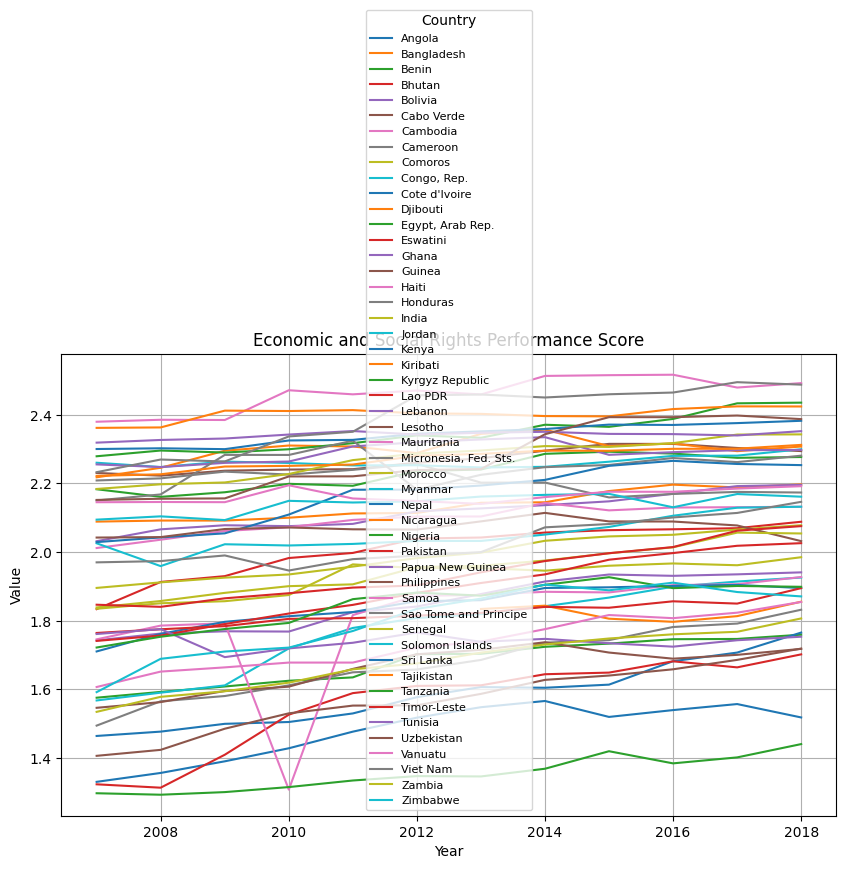

In [21]:
wb_data_LMC = WorldBankData()
LMC = [i['id'] for i in wbdata.get_countries(incomelevel='LMC')]
print("Lowwer-middle income level contains ", len(LMC), "countries.")
for indi in indicators:
    wb_data_LMC.load_ts_wb_data(LMC, {indi:indicators[indi]})
    wb_data_LMC.plot_ts_byindicator(indi)

#### Load Data: Low Income Countries (LIC)

Low income level contains  26 countries.


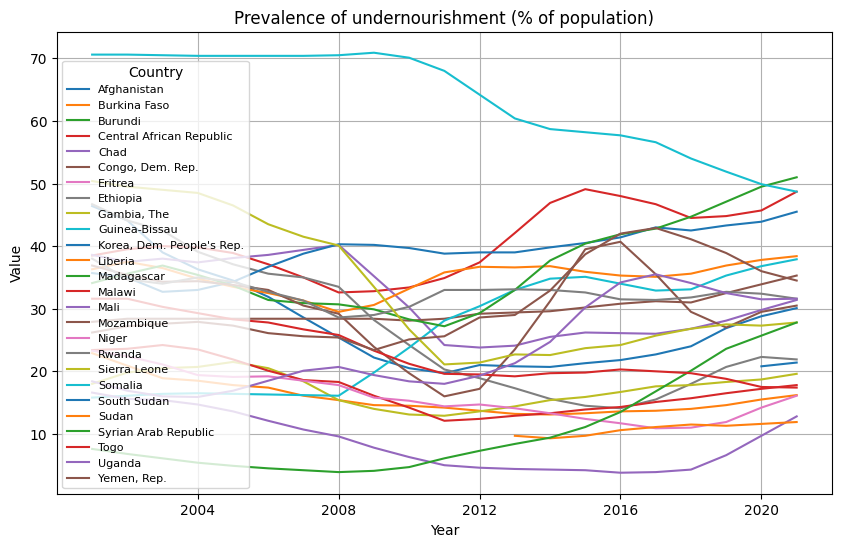

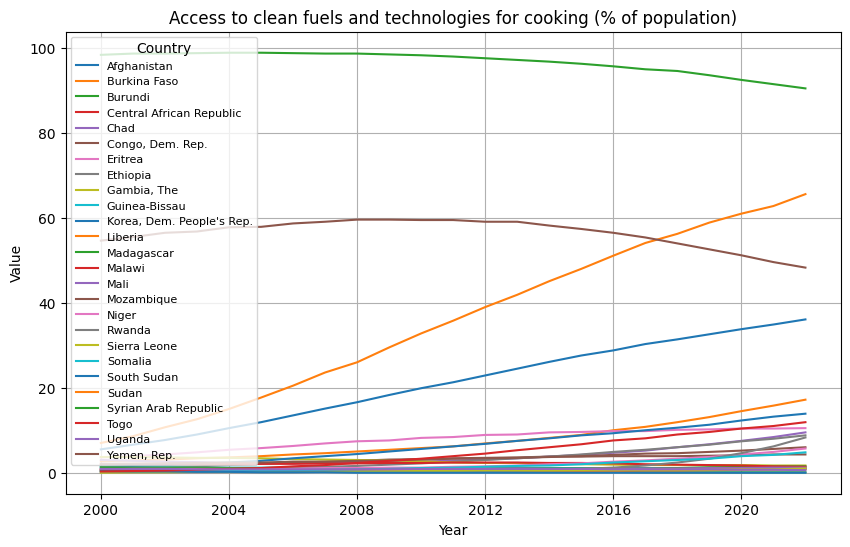

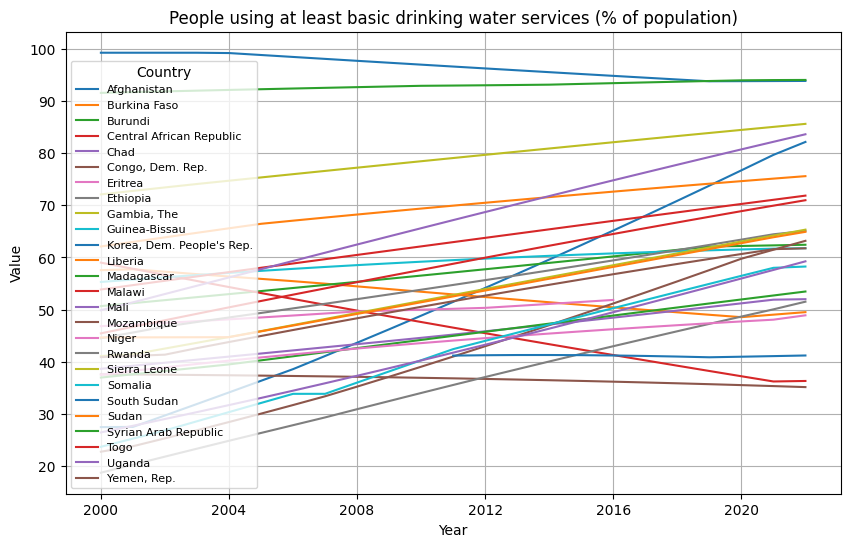

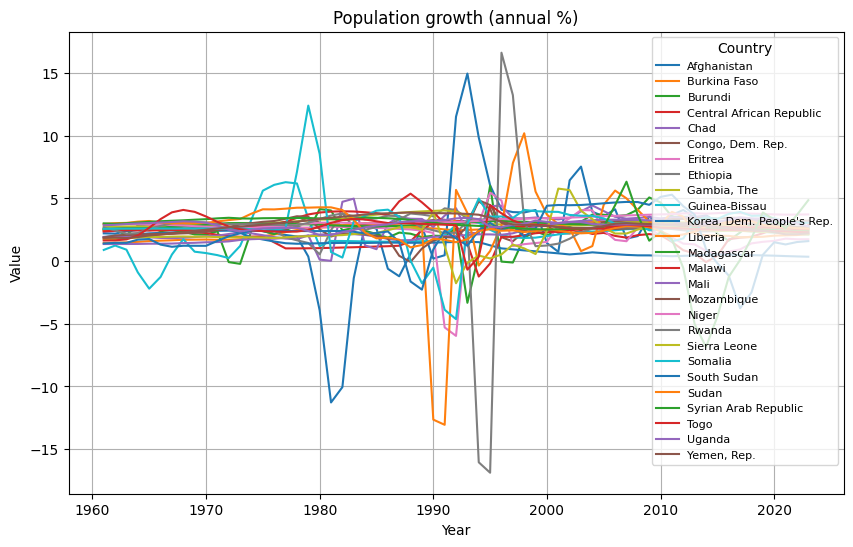

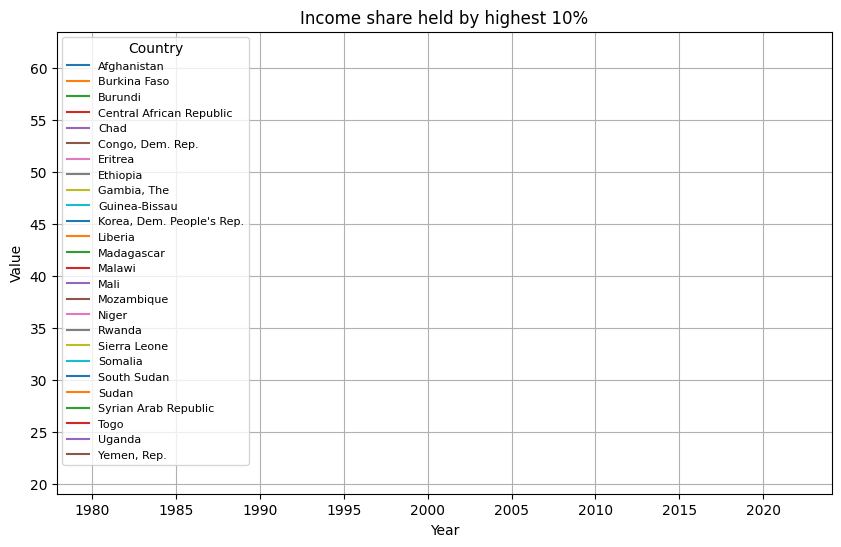

...

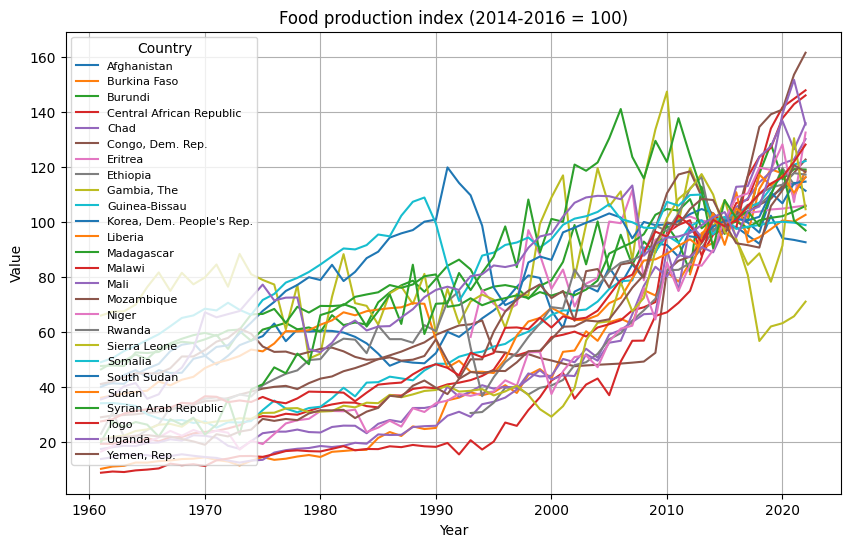

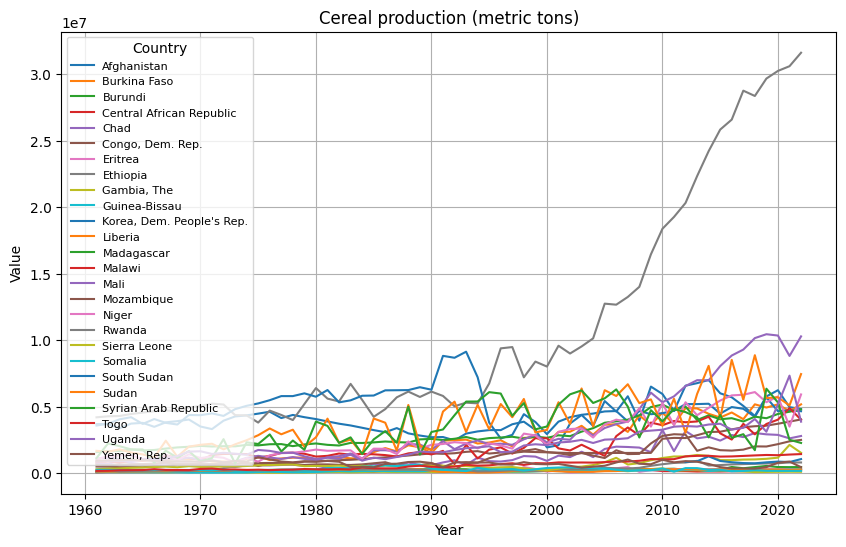

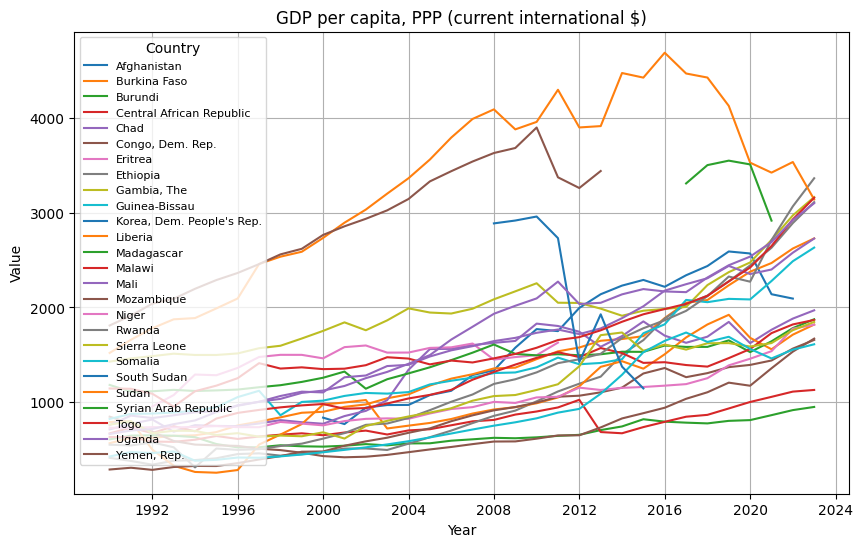

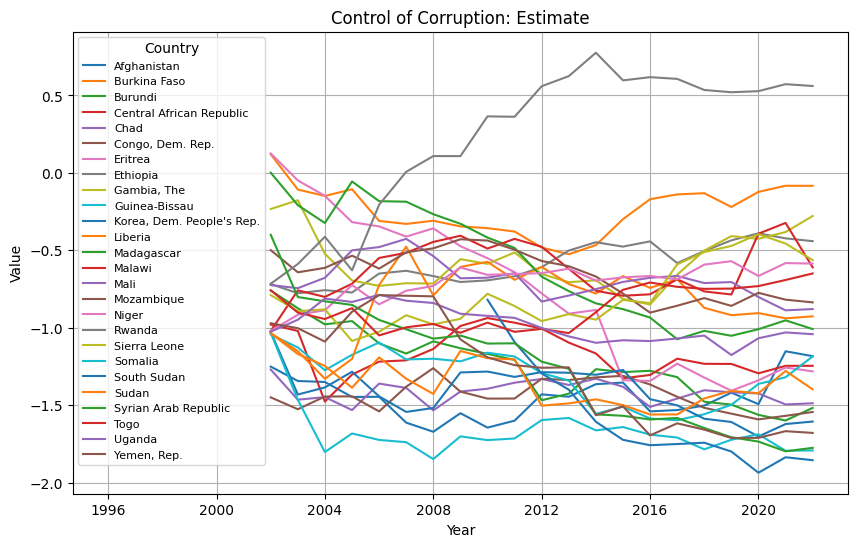

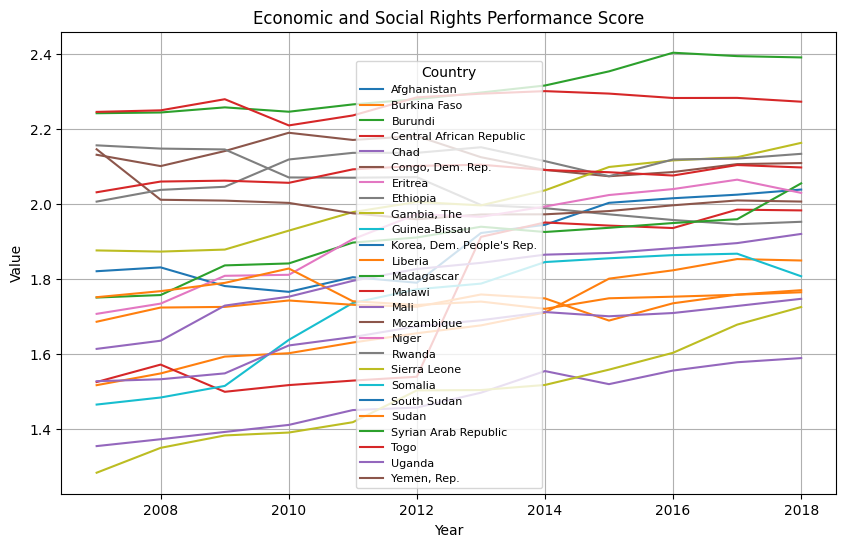

In [25]:
wb_data_LIC = WorldBankData()
LIC = [i['id'] for i in wbdata.get_countries(incomelevel='LIC')]
print("Low income level contains ", len(LIC), "countries.")
for indi in indicators:
    wb_data_LIC.load_ts_wb_data(LIC, {indi:indicators[indi]})
    wb_data_LIC.plot_ts_byindicator(indi)

### Source 2: Our World in Data

In [27]:
daily_supply_df = pd.read_csv('daily-per-capita-caloric-supply.csv')
daily_supply_df.drop('Code', axis=1, inplace = True)
daily_supply_df.rename(columns = {'Entity':'Country', 'Daily calorie supply per person':'Daily Supply (calorie)'}, inplace = True)
daily_supply_df.set_index(['Country', 'Year'], inplace = True)

In [29]:
def divide_by_income_levels(daily_supply_df, LIC, LMC, UMC, HIC):
    # Create a dictionary mapping ISO alpha-3 codes to country names
    code_to_name = {country.alpha_3: country.name for country in pycountry.countries}
    # Convert the lists of country codes to country names
    LIC_names = [code_to_name[code] for code in LIC if code in code_to_name]
    LMC_names = [code_to_name[code] for code in LMC if code in code_to_name]
    UMC_names = [code_to_name[code] for code in UMC if code in code_to_name]
    HIC_names = [code_to_name[code] for code in HIC if code in code_to_name]
    # Filter the DataFrame for each income level
    lic_df = daily_supply_df[daily_supply_df.index.get_level_values('Country').isin(LIC_names)]
    lmc_df = daily_supply_df[daily_supply_df.index.get_level_values('Country').isin(LMC_names)]
    umc_df = daily_supply_df[daily_supply_df.index.get_level_values('Country').isin(UMC_names)]
    hic_df = daily_supply_df[daily_supply_df.index.get_level_values('Country').isin(HIC_names)]
    return (lic_df, lmc_df, umc_df, hic_df)
def calculate_yearly_average(daily_supply_df):
    # Group by 'Year' and calculate the mean of 'Daily Supply (calorie)'
    yearly_avg_df = daily_supply_df.groupby('Year')['Daily Supply (calorie)'].mean().reset_index()
    yearly_avg_df.set_index('Year', inplace=True)
    return (yearly_avg_df)

In [31]:
daily_supply_LIC, daily_supply_LMC, daily_supply_UMC, daily_supply_HIC = divide_by_income_levels(daily_supply_df, LIC, LMC, UMC, HIC)
daily_supply_LIC_avg = calculate_yearly_average(daily_supply_LIC)
daily_supply_LMC_avg = calculate_yearly_average(daily_supply_LMC)
daily_supply_UMC_avg = calculate_yearly_average(daily_supply_UMC)
daily_supply_HIC_avg = calculate_yearly_average(daily_supply_HIC)

<br><br><br>

## Exploration & Visualization

This section explores socioeconomic indicators related to undernourishment, focusing on World Bank income classifications. By grouping countries into low, lower-middle, upper-middle, and high-income levels, we observe distinct trends in each indicator and analyze how these patterns differ across income groups. We also examine the correlation between each indicator and undernourishment rates by income level, highlighting the varying impacts of socioeconomic factors on undernourishment across these classifications.

### Income Level Classification by World Bank

The world map in Figure 1, visualized using World Bank Data, showcases the classification of countries based on their income levels. This map has been utilized as countries within the same income group have been observed to portray overlapping characteristics such as income disparity levels, corruption levels, population growth rate, etc. West European and North American countries predominantly fell into the high-income groups, while the low-income group nations were located in Central Africa. The upper-middle-income and lower-middle-income countries were situated in south and south-east Asia, Africa and South America. Due to these similar trends based on income levels, the model was able to generalize trends more effectively within each cluster.

### Average World Bank Indicator Plots by Income Level

Figure 2: Indicator Averages by Income Level


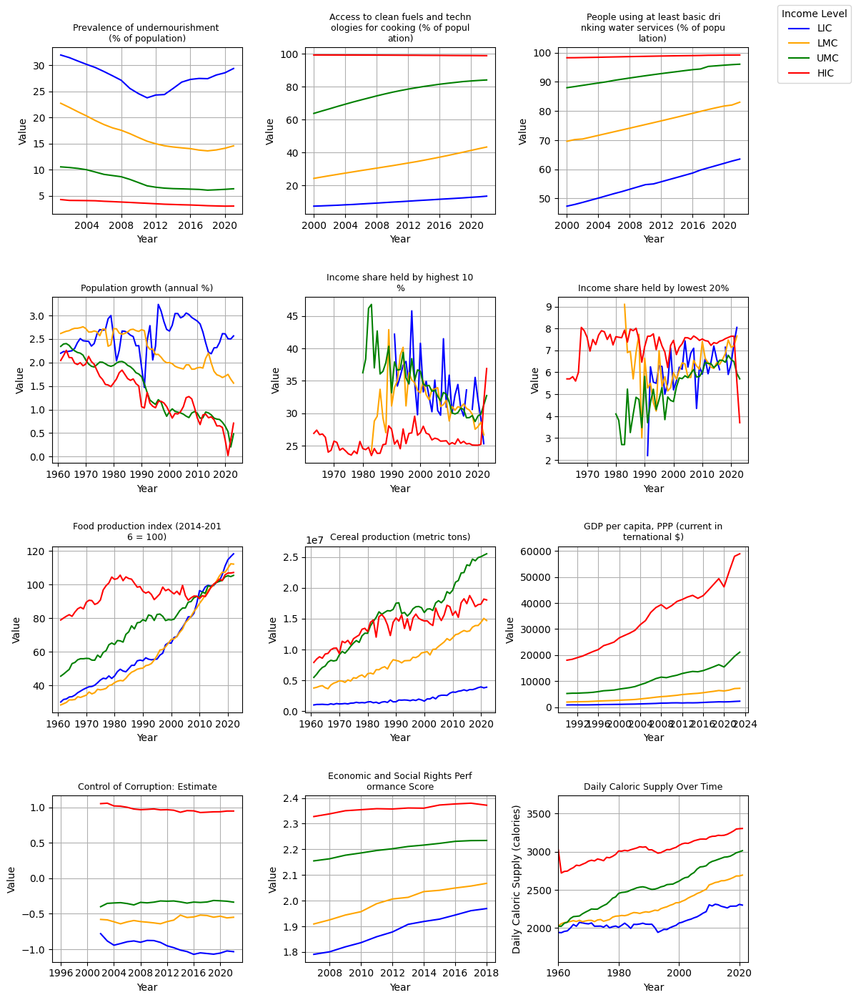

In [172]:
# Plot average of all indicators and add daily calorie supply as the last plot
def plot_all_indicators_average_by_levels(indicators, daily_supply_LIC_avg, daily_supply_LMC_avg, daily_supply_UMC_avg, daily_supply_HIC_avg):
    # Set up a grid of subplots with appropriate size
    nrows = 4  # Adjust based on the number of indicators (e.g., 4 rows and 3 columns for 11 indicators)
    ncols = 3
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, 14))
    axes = axes.flatten()  # Flatten to easily iterate over axes
    
    # Loop through each indicator to plot on a separate subplot
    for idx, (indi_code, indi_name) in enumerate(indicators.items()):
        # Calculate average for each income level
        LIC_indi_avg = wb_data_LIC.calculate_average_overtime(indi_code)
        LMC_indi_avg = wb_data_LMC.calculate_average_overtime(indi_code)
        UMC_indi_avg = wb_data_UMC.calculate_average_overtime(indi_code)
        HIC_indi_avg = wb_data_HIC.calculate_average_overtime(indi_code)
        
        # Select the subplot
        ax = axes[idx]
        
        # Plot each income level with specified color
        ax.plot(LIC_indi_avg['Date'], LIC_indi_avg['average'], label='LIC', color='blue')
        ax.plot(LMC_indi_avg['Date'], LMC_indi_avg['average'], label='LMC', color='orange')
        ax.plot(UMC_indi_avg['Date'], UMC_indi_avg['average'], label='UMC', color='green')
        ax.plot(HIC_indi_avg['Date'], HIC_indi_avg['average'], label='HIC', color='red')
        
        # Set title with line wrapping
        wrapped_title = "\n".join(indi_name[i:i+31] for i in range(0, len(indi_name), 31))
        ax.set_title(wrapped_title, fontsize=9)  # Adjust fontsize if needed
        ax.set_xlabel("Year")
        ax.set_ylabel("Value")
        ax.grid(True)
    
    # Plot the daily calorie supply in the last subplot
    last_ax = axes[len(indicators)]  # Use the next available subplot
    last_ax.plot(daily_supply_LIC_avg.index, daily_supply_LIC_avg['Daily Supply (calorie)'], label='LIC', color='blue')
    last_ax.plot(daily_supply_LMC_avg.index, daily_supply_LMC_avg['Daily Supply (calorie)'], label='LMC', color='orange')
    last_ax.plot(daily_supply_UMC_avg.index, daily_supply_UMC_avg['Daily Supply (calorie)'], label='UMC', color='green')
    last_ax.plot(daily_supply_HIC_avg.index, daily_supply_HIC_avg['Daily Supply (calorie)'], label='HIC', color='red')
    last_ax.set_title("Daily Caloric Supply Over Time", fontsize=9)
    last_ax.set_xlabel("Year")
    last_ax.set_xlim([1960, 2023])
    last_ax.set_ylabel("Daily Caloric Supply (calories)")
    last_ax.grid(True)
    
    # Add a legend for the entire figure
    handles, labels = last_ax.get_legend_handles_labels()
    fig.legend(handles, labels, title="Income Level", loc="upper right")
    
    # Adjust layout and remove any empty subplots if necessary
    for j in range(len(indicators) + 1, len(axes)):
        fig.delaxes(axes[j])  # Remove unused axes if any
    
    # Adjust layout for better readability
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    fig.subplots_adjust(hspace=0.5)  # Add more vertical space between subplots
    plt.show()

print("Figure 2: Indicator Averages by Income Level")
plot_all_indicators_average_by_levels(indicators, daily_supply_LIC_avg, daily_supply_LMC_avg, daily_supply_UMC_avg, daily_supply_HIC_avg)

Figure 2 further highlights how the various indicators from these different income groups vary in relation to one another. Here, we notice trends that ascribe certain characteristics to certain income groups. Some of the trends also highlight the hierarchical differences between the income groups, with high-income group countries fairing much better in almost all the indicators.

### Correlation between the Prevalence of Undernourishment and other World Bank Indicators

Figure 3: Correlation between Prevalence of Undernourishment and Other World Bank Indicators


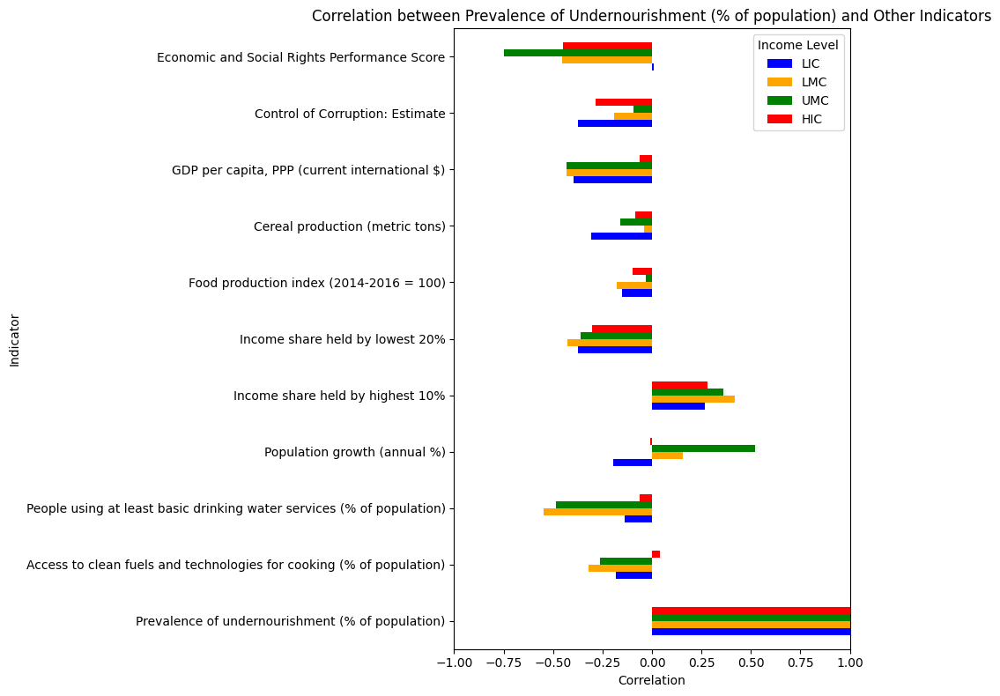

In [170]:
def plot_undernourishment_correlation():
    # Calculate correlations
    LIC_undernourishment_corr = wb_data_LIC.check_correlation()['Prevalence of undernourishment (% of population)']
    LMC_undernourishment_corr = wb_data_LMC.check_correlation()['Prevalence of undernourishment (% of population)']
    UMC_undernourishment_corr = wb_data_UMC.check_correlation()['Prevalence of undernourishment (% of population)']
    HIC_undernourishment_corr = wb_data_HIC.check_correlation()['Prevalence of undernourishment (% of population)']
    
    # Combine them into a DataFrame
    df = pd.DataFrame({'LIC': LIC_undernourishment_corr,
                       'LMC': LMC_undernourishment_corr,
                       'UMC': UMC_undernourishment_corr,
                       'HIC': HIC_undernourishment_corr})
    
    # Define colors for each income group
    group_colors = {'LIC': 'blue', 'LMC': 'orange', 'UMC': 'green', 'HIC': 'red'}
    
    # Plotting a transposed (horizontal) grouped bar chart with specified colors
    ax = df.plot(kind='barh', figsize=(10, 8), color=[group_colors[col] for col in df.columns])
    ax.set_ylabel("Indicator")
    ax.set_xlabel("Correlation")
    ax.set_title("Correlation between Prevalence of Undernourishment (% of population) and Other Indicators")
    ax.legend(title="Income Level")
    ax.set_xlim(-1, 1)
    plt.tight_layout()
    plt.savefig('correlation.png')
    plt.show()

print("Figure 3: Correlation between Prevalence of Undernourishment and Other World Bank Indicators")
plot_undernourishment_correlation()

Figure 3 illustrates the correlation between the prevalence of undernourishment and various socioeconomic indicators from the World Bank, with correlations differing across income levels.

__Access to Drinking Water and Clean Cooking Fuel__

Figure 3 showcases that the availability of drinking water and clean cooking fuel trends are clearly differentiated based on income groups, with high-income countries having the most access to both these resources and low-income countries having the least access. Hence, it intuitively follows that the availability of these amenities is related to the level of undernourishment. The lower levels of correlation between these indicators and the undernourishment rate for high-income countries is due to the fact that these countries already possess near-perfect access to both these resources. However, the graphs for the other income groups showcase that there has been a steady increase in the availability of these resources within this time period. Hence, we see a sizable correlation between the undernourishment rate and access to these resources for both upper and lower-middle-income countries owing to their steady rate of improving access to these resources. However, due to the higher prevalence of other factors, we decided not to use this indicator in our final model.

__Income share held by highest 10% and income share held by lowest 20%__

A positive correlation between the income share held by the highest 10% and the undernourishment rate shows that as the income share held by the top 10% increases in a country, the undernourishment rate also rises. Conversely, negative correlations are shown in the correlation between the undernourishment rate and income share held by the lowest 20%, which means the lower the income share held by this group, the higher the undernourishment rate goes.

A logical conclusion is that income share plays a role in undernourishment rate, in which the lower-income population tend to have less financial capability, and therefore unable to buy food, leading to high rate of undernourishment. Meanwhile, the higher-income population with positive correlation faces the opposite effect. These insights align very well with research that found undernutrition is primarily concentrated in poor households, while concentration of overweight and obesity mostly occur in higher-income households (Alao et al., 2021).

We can also draw a logical conclusion that inequality does play a role in affecting the undernourishment rate, as the correlation of the undernourishment rate between these two groups diverges significantly from each other to the completely opposite direction. The huge disparity between the correlation of both income groups in all types of countries shows that inequality exists across all groups of countries, including high-income ones. However, the cause of the small decrease in correlation magnitude among lower-income countries compared to lower-middle income remains unclear.

Talking about the overall trend, although the huge disparity in income share is still happening all around the world, observing the time-series data, we can see that this gap is getting smaller over time for all country types, except high-income countries whose income share gap mostly remains stable. For groups other than high-income countries, the trend for income share among the lowest 20% has been increasing constantly since 1990, and the opposite has happened to the income share of the highest 10%.

Although these two factors correlate well with the undernourishment rate, we decided not to use them due to incomplete time-series data.

__Population Growth__

Figure 2 showcases the high correlation between the population growth rate and the undernourishment rate for upper-middle-income countries. This can be tied to the fact that the population growth rates in these countries, particularly South American and East European countries, have been steadily declining over the turn of the century. Figure 3 portrays the steep decline in population growth in the upper-middle-income countries and the slow decline in their undernourishment rate. However, the correlations for the other income groups are rather low. For the high-income group, this is due to the relative absence of undernourishment regardless of the population growth rate. For upper-middle-income countries, as the population growth rate fluctuates, the undernourishment rate continues to decline. Due to the high correlation between the undernourishment rate and population growth in upper-middle-income countries, we decided to use this indicator in our model.

__GDP per capita__

A high-magnitude negative correlation between the undernourishment rate and GDP per capita (PPP) for 3 groups of countries, excluding high-income countries, indicates that an increase in GDP per capita in these groups will significantly reduce the undernourishment rate. Meanwhile, the high-income countries group shows a very small correlation, meaning that an increase or decrease in GDP per capita will not significantly affect the undernourishment rate.

The difference in the behavior between high-income countries and the other three groups is because high-income countries already have high absolute income levels, leading to higher purchasing power (Alao et al., 2021). This means that even when there are certain populations in high-income countries that receive lower income compared to the domestic median, their absolute buying power is still much higher compared to the other 3 countries. This high purchasing power enables them to afford enough food on average and makes the movement in their GDP per capita level less correlated to the undernourishment rate.

As an example of how great the disparity between the absolute GDP per capita between high-income countries group and others, China, which is known for its strong economic growth and classified as an upper-middle-income country, has a GDP per capita (PPP) of 25,015 USD, while the Netherlands, a high-income country, has a GDP per capita (PPP) of 74,158 USD. Despite being only one income classification apart, there is a significant gap in their absolute income level that greatly affects their purchasing power. 

GDP per capita shows a similar trend for all country groups, where all the indicators show a constant increase over time, with high-income country groups seeing the largest increase while low-income countries see the smallest.

We chose to incorporate this in the analysis since the data correlates well, has clear causality, and complete data is available.

__Food Production Index (FPI) and Cereal Production__

Counterintuitively, the food production index has minimal effect on the undernourishment rate. The lack of pattern in the correlation, shown by high-magnitude correlation in lower-income countries and lower-middle countries, continued with very low correlation by upper-middle-income countries and a small increase for the high-income countries, indicates there is no clear relation between the two factors. Undernourishment trends showed no meaningful variations among countries across different GDP tertiles, food production, and livestock production indices (Eini-Zinab et al., 2020). There have been several theories that explain this lack of correlation, such as different dietary preferences from the produced food, export-oriented production, unequal income distribution, and high purchasing power that enables food import.

Cereal production, however, presents a unique case owing to how cereals constitute a staple in cuisines around the world, especially in low-income countries that heavily rely on cereal for their food intake (Shahane et al., 2024). Hence, it is observed that there is a high correlation between cereal production in low-income countries and undernourishment rates. Furthermore, Figure 3 showcases how cereal production in low-income countries is extremely low compared to that of other groups. However, due to its lower correlation for other groups, we decided to pick other factors.

__Economic and Social Rights Performance Score__

Unlike many human rights indicators developed by the United Nations and academia, the Economic and Social Rights Performance Score (ESRP) focused on positive obligations such as the right to education and the right to social security (Randolph et al., 2009). This makes the indicator very useful in seeing the performance of the government in fulfilling its obligation to its citizens. As we can see from the chart, 3 groups, excluding low-income countries, managed to have high scores of ESRP, meaning the increase in government obligation fulfillment decreases the rate of undernourishment. This is because food assistance is usually a part of broader social security. A higher score means a higher level of food assistance, which in turn decreases the undernourishment rate.

On the other hand, the low-income groups show a very small correlation between the undernourishment rate and ESRP. (Randolph et al., 2009) suggests that many low-income countries with low ESRP (Economic and Social Rights Performance) score heavily rely on external cooperation resources, such as international aid, which typically finance large infrastructure projects, while domestic funds cover recurrent expenses like salaries. This dependence on external funding allows donors to influence priorities, often sidelining economic and social rights. As a result, these countries struggle to meet basic needs and fulfil their economic and social rights obligations, like food assistance programs. This reliance on external aid with potentially misaligned priorities can limit their ability to effectively address undernourishment, explaining the weak correlation between undernourishment rates and ESRP scores in low-income countries.

Despite the low-income countries having a low correlation, this group actually shows the steepest increase in its ESRP score, meaning they are catching up rapidly with the other groups. Meanwhile, the high-income countries show the slowest increase. But this is compensated by the fact that this group already achieved a very high score, therefore making it reasonable if their score gets stuck as they already hit the effective ceiling.

We decided to use this factor in the analysis since they correlate well with the undernourishment rate, have clear causality, and complete data is available.

__Daily Caloric Supply__

The daily caloric supply, as seen in Figure 3, showcases that income groups follow a clear trend. High-income countries have higher caloric intake, around 3250 kilocalories per individual per day, whereas low-income countries only have roughly 2,260 kilocalories per individual per day. However, it is important to note that calorie distribution does not pain the full picture. In high-income countries, diets may include more protein, vitamins, and minerals, whereas low-income countries often have diets heavier in staple grains but deficient in essential nutrients. The stark delineation between the income groups, therefore, paints the picture of how calorie intake is still a very prominent factor in determining undernourishment rates, with the NHS recommending that an average man needs 2,500 kcal a day, whereas an average woman requires 2,000 calories per day. This is a factor we’ve decided to use in our model since the differences between the income groups are prominent and due to its very intuitive and direct link to undernourishment rates. International organizations, such as the FAO and WHO, further utilize benchmarks in caloric needs to design food assistance programs, and hence, it is a very important indicator in studying food security.

<br><br><br>

## Machine Learning

In this analysis, machine learning is used to build __a predictive model for the prevalence of undernourishment (%) in upper-middle-income countries (UMC)__. The decision to focus on this specific income group is based on earlier findings, which suggest that different income groups may experience undernourishment influenced by distinct factors and indicators.

High-income countries (HIC) are shown to have minimal levels of undernourishment (Figure 2), indicating a lower need for predictive intervention in these regions. Conversely, for low-income countries (LIC) and lower-middle-income countries (LMC), limited data availability makes forecasting challenging. Thus, we chose to develop a model specifically for upper-middle-income countries (UMC), where data availability supports effective analysis.

The designed model uses the previous year’s undernourishment rate as well as historical data for four additional indicators: GDP per capita (current $), population growth rate (%), Economic and Social Rights Performance (ESRP) score, and daily calorie supply per person. These features serve as inputs to predict the undernourishment rate for the following year. This predictive approach is illustrated in Figure 4, with data spanning from 2007 to 2018.

A deep neural network was selected to construct the model. The steps involved, from data preparation to model training and evaluation, are detailed in the subsequent sections of this report.


Figure 4: Undernourishment Rate Prediction Model
![image](G15_MLmodel.png)

### 1. Load data
In this step, all required features are imported to prepare for modeling.

#### World Bank data

In [37]:
# Load selected World Bank Data
UMC = [i['id'] for i in wbdata.get_countries(incomelevel='UMC')]
selected_indicators = {'SN.ITK.DEFC.ZS': 'Prevalence of undernourishment (% of population)',
                       'SP.POP.GROW': 'Population growth (annual %)',
                       'NY.GDP.PCAP.PP.CD': 'GDP per capita, PPP (current international $)',
                       'SD.ESR.PERF.XQ': 'Economic and Social Rights Performance Score'}
selected_wb_df = wbdata.get_dataframe(selected_indicators, country=UMC, date=('2007','2018'), freq='Y')
selected_wb_df.reset_index(inplace = True)
selected_wb_df.rename(columns={'country': 'Country', 'date':'Year'}, inplace = True)
selected_wb_df = selected_wb_df.astype({"Year": int})
selected_wb_df.set_index(['Country', 'Year'], inplace = True)
selected_wb_df

Prevalence of undernourishment (% of population)  \
Country Year                                                     
Albania 2007                                               8.3   
        2008                                               7.4   
        2009                                               6.1   
        2010                                               5.4   
        2011                                               4.8   
...                                                        ...   
Ukraine 2014                                               2.5   
        2015                                               2.5   
        2016                                               2.5   
        2017                                               2.5   
        2018                                               2.8   

              Population growth (annual %)  \
Country Year                                 
Albania 2007                     -0.755719   
        2008                     -0.767343   
        2009                     -0.673894   
        2010                     -0.496462   
        2011                     -0.269017   
...                                    ...   
Ukraine 2014                     -0.479262   
        2015                     -0.231768   
        2016                     -0.286266   
        2017                     -0.350267   
        2018                     -0.424632   

              GDP per capita, PPP (current international $)  \
Country Year                                                  
Albania 2007                                    7284.887343   
        2008                                    8228.131887   
        2009                                    8812.604737   
        2010                                    9626.664893   
        2011                                   10207.169878   
...                                                     ...   
Ukraine 2014                                   10664.624023   
        2015                                   10064.842773   
        2016                                   11011.970703   
        2017                                   11686.857422   
        2018                                   12708.798828   

              Economic and Social Rights Performance Score  
Country Year                                                
Albania 2007                                      2.345318  
        2008                                      2.331715  
        2009                                      2.263717  
        2010                                      2.273091  
        2011                                      2.282119  
...                                                    ...  
Ukraine 2014                                      2.303830  
        2015                                      2.334382  
        2016                                      2.324862  
        2017                                      2.335921  
        2018                                      2.379713  

[648 rows x 4 columns]

#### Daily supply data

In [39]:
daily_supply_df

Daily Supply (calorie)
Country     Year                        
Afghanistan 1961               3054.9053
            1962               2973.2468
            1963               2751.7795
            1964               3013.4424
            1965               3017.7600
...                                  ...
Zimbabwe    2017               2045.9998
            2018               2065.9985
            2019               2025.0006
            2020               2014.0009
            2021               2048.9993

[12825 rows x 1 columns]

### 2. Merge two datasets
Since the data come from two different sources, they were merged into a single DataFrame using common indices. The resulting merged table contains 5 columns (representing 5 indicators) and covers 54 countries over 12 years (2007 to 2018), yielding a total of 648 rows.

In [41]:
merged_df = pd.merge(selected_wb_df, daily_supply_df, how='left', left_index=True, right_index=True)
merged_df

Prevalence of undernourishment (% of population)  \
Country Year                                                     
Albania 2007                                               8.3   
        2008                                               7.4   
        2009                                               6.1   
        2010                                               5.4   
        2011                                               4.8   
...                                                        ...   
Ukraine 2014                                               2.5   
        2015                                               2.5   
        2016                                               2.5   
        2017                                               2.5   
        2018                                               2.8   

              Population growth (annual %)  \
Country Year                                 
Albania 2007                     -0.755719   
        2008                     -0.767343   
        2009                     -0.673894   
        2010                     -0.496462   
        2011                     -0.269017   
...                                    ...   
Ukraine 2014                     -0.479262   
        2015                     -0.231768   
        2016                     -0.286266   
        2017                     -0.350267   
        2018                     -0.424632   

              GDP per capita, PPP (current international $)  \
Country Year                                                  
Albania 2007                                    7284.887343   
        2008                                    8228.131887   
        2009                                    8812.604737   
        2010                                    9626.664893   
        2011                                   10207.169878   
...                                                     ...   
Ukraine 2014                                   10664.624023   
        2015                                   10064.842773   
        2016                                   11011.970703   
        2017                                   11686.857422   
        2018                                   12708.798828   

              Economic and Social Rights Performance Score  \
Country Year                                                 
Albania 2007                                      2.345318   
        2008                                      2.331715   
        2009                                      2.263717   
        2010                                      2.273091   
        2011                                      2.282119   
...                                                    ...   
Ukraine 2014                                      2.303830   
        2015                                      2.334382   
        2016                                      2.324862   
        2017                                      2.335921   
        2018                                      2.379713   

              Daily Supply (calorie)  
Country Year                          
Albania 2007               3042.5032  
        2008               3151.9840  
        2009               3218.1445  
        2010               3255.9976  
        2011               3295.9885  
...                              ...  
Ukraine 2014               3142.0000  
        2015               3076.9993  
        2016               3065.0002  
        2017               3035.0000  
        2018               2988.9998  

[648 rows x 5 columns]

In [43]:
# save merged_df as a CSV file
merged_df.to_csv('merged_df.csv')

### 3. Handle missing data

The missing data were examined for each indicator, starting with the target variable, Prevalence of Undernourishment, followed by the input indicators:

In [45]:
# print rows that have no undernourishment rate data.
merged_df[merged_df['Prevalence of undernourishment (% of population)'].isna()]

Prevalence of undernourishment (% of population)  \
Country           Year                                                     
Equatorial Guinea 2007                                               NaN   
                  2008                                               NaN   
                  2009                                               NaN   
                  2010                                               NaN   
                  2011                                               NaN   
...                                                                  ...   
Tuvalu            2014                                               NaN   
                  2015                                               NaN   
                  2016                                               NaN   
                  2017                                               NaN   
                  2018                                               NaN   

                        Population growth (annual %)  \
Country           Year                                 
Equatorial Guinea 2007                      4.681607   
                  2008                      4.750081   
                  2009                      4.780037   
                  2010                      4.756089   
                  2011                      4.472518   
...                                              ...   
Tuvalu            2014                     -0.174176   
                  2015                     -0.202057   
                  2016                     -0.230107   
                  2017                     -0.221402   
                  2018                      0.341124   

                        GDP per capita, PPP (current international $)  \
Country           Year                                                  
Equatorial Guinea 2007                                   29057.252195   
                  2008                                   33270.184959   
                  2009                                   32341.598475   
                  2010                                   28428.586667   
                  2011                                   29556.113101   
...                                                               ...   
Tuvalu            2014                                    3381.323457   
                  2015                                    3775.815153   
                  2016                                    4036.732177   
                  2017                                    4218.957650   
                  2018                                    4360.578703   

                        Economic and Social Rights Performance Score  \
Country           Year                                                 
Equatorial Guinea 2007                                      0.856236   
                  2008                                      0.799200   
                  2009                                      0.820439   
                  2010                                      0.888390   
                  2011                                      0.929757   
...                                                              ...   
Tuvalu            2014                                      2.395714   
                  2015                                      2.392215   
                  2016                                      2.351022   
                  2017                                      2.419221   
                  2018                                      2.324422   

                        Daily Supply (calorie)  
Country           Year                          
Equatorial Guinea 2007                     NaN  
                  2008                     NaN  
                  2009                     NaN  
                  2010                     NaN  
                  2011                     NaN  
...                                        ...  
Tuvalu            2014     

In [47]:
# find countries that the undernourishment rates are missing
merged_df[merged_df['Prevalence of undernourishment (% of population)'].isna()].index.unique('Country')

Index(['Equatorial Guinea', 'Grenada', 'Kosovo', 'Maldives',
       'Marshall Islands', 'St. Lucia', 'Tonga', 'Tuvalu'],
      dtype='object', name='Country')

For the target variable, Prevalence of Undernourishment, data are missing for 8 out of 54 UMC countries across the 12-year period (2007-2018), resulting in 96 missing rows. These rows were removed from the dataset.

In [49]:
# drop rows containing nan values only from particular column(s)
merged_df.dropna(subset=['Prevalence of undernourishment (% of population)'], inplace = True)

In [51]:
# find countries that the undernourishment rates are missing
merged_df[merged_df['Population growth (annual %)'].isna()].index.unique('Country')

Index([], dtype='object', name='Country')

Population Growth (annual %) has complete data, with no missing values.

In [54]:
# find countries that the GDP per capita are missing
merged_df[merged_df['GDP per capita, PPP (current international $)'].isna()].index.unique('Country')

Index(['Cuba'], dtype='object', name='Country')

GDP per Capita is missing data only for Cuba, so rows related to this entry were removed.


In [57]:
# drop rows containing nan values only from particular column(s)
merged_df.dropna(subset=['GDP per capita, PPP (current international $)'], inplace = True)

In [59]:
# find countries that the Economic and Social Rights Performance Scores are missing
merged_df[merged_df['Economic and Social Rights Performance Score'].isna()].index.unique('Country')

Index([], dtype='object', name='Country')

Economic and Social Rights Performance (ESRP) Score is fully complete, with no missing values.

In [62]:
# find countries that the Daily Supply data is missing
merged_df[merged_df['Daily Supply (calorie)'].isna()]

Prevalence of undernourishment (% of population)  \
Country                        Year                                                     
Iran, Islamic Rep.             2007                                               6.1   
                               2008                                               5.8   
                               2009                                               6.2   
                               2010                                               7.1   
                               2011                                               7.6   
                               2012                                               7.3   
                               2013                                               6.3   
                               2014                                               6.3   
                               2015                                               6.3   
                               2016                                               6.8   
                               2017                                               7.2   
                               2018                                               7.2   
Libya                          2007                                               5.3   
                               2008                                               5.6   
                               2009                                               6.7   
St. Vincent and the Grenadines 2007                                               7.3   
                               2008                                               6.9   
                               2009                                               6.5   
                               2010                                               6.3   
                               2011                                               6.0   
                               2012                                               5.7   
                               2013                                               5.6   
                               2014                                               5.3   
                               2015                                               5.0   
                               2016                                               4.3   
                               2017                                               3.6   
                               2018                                               3.2   
Turkiye                        2007                                               2.5   
                               2008                                               2.5   
                               2009                                               2.5   
                               2010                                               2.5   
                               2011                                               2.5   
                               2012                                               2.5   
                               2013                                               2.5   
                               2014                                               2.5   
                               2015                                               2.5   
                               2016                                               2.5   
                               2017                                               2.5   
                               2018                                               2.5   

                                     Population growth (annual %)  \
Country                        Year                                 
Iran, Islamic Rep.             2007                      1.453637   
                               2008                      1.371885   
                               2009                      1.360470   
                               2010       

For Daily Calorie Supply, data are missing for three countries (Iran, St. Vincent and the Grenadines, and Turkey) over the entire 12-year period, along with Libya’s data from 2007-2009. This results in 39 missing rows, which were also removed.

In [65]:
# drop rows containing nan values only from particular column(s)
merged_df.dropna(subset=['Daily Supply (calorie)'], inplace = True)

In [67]:
merged_df

Prevalence of undernourishment (% of population)  \
Country Year                                                     
Albania 2007                                               8.3   
        2008                                               7.4   
        2009                                               6.1   
        2010                                               5.4   
        2011                                               4.8   
...                                                        ...   
Ukraine 2014                                               2.5   
        2015                                               2.5   
        2016                                               2.5   
        2017                                               2.5   
        2018                                               2.8   

              Population growth (annual %)  \
Country Year                                 
Albania 2007                     -0.755719   
        2008                     -0.767343   
        2009                     -0.673894   
        2010                     -0.496462   
        2011                     -0.269017   
...                                    ...   
Ukraine 2014                     -0.479262   
        2015                     -0.231768   
        2016                     -0.286266   
        2017                     -0.350267   
        2018                     -0.424632   

              GDP per capita, PPP (current international $)  \
Country Year                                                  
Albania 2007                                    7284.887343   
        2008                                    8228.131887   
        2009                                    8812.604737   
        2010                                    9626.664893   
        2011                                   10207.169878   
...                                                     ...   
Ukraine 2014                                   10664.624023   
        2015                                   10064.842773   
        2016                                   11011.970703   
        2017                                   11686.857422   
        2018                                   12708.798828   

              Economic and Social Rights Performance Score  \
Country Year                                                 
Albania 2007                                      2.345318   
        2008                                      2.331715   
        2009                                      2.263717   
        2010                                      2.273091   
        2011                                      2.282119   
...                                                    ...   
Ukraine 2014                                      2.303830   
        2015                                      2.334382   
        2016                                      2.324862   
        2017                                      2.335921   
        2018                                      2.379713   

              Daily Supply (calorie)  
Country Year                          
Albania 2007               3042.5032  
        2008               3151.9840  
        2009               3218.1445  
        2010               3255.9976  
        2011               3295.9885  
...                              ...  
Ukraine 2014               3142.0000  
        2015               3076.9993  
        2016               3065.0002  
        2017               3035.0000  
        2018               2988.9998  

[501 rows x 5 columns]

After addressing missing data, the dataset contains 501 rows with 5 key features, which provides a robust foundation for machine learning analysis.

### 4. Preprocessing

In this step, data were preprocessed to prepare for model training. To create the target column (Prevalence of Undernourishment), the data were shifted up by one timestep to allow for future value prediction. The other variables were duplicated and renamed to simplify handling and reference in the model.

In [72]:
# Step 1: Create Y by shifting the target variable within each country
merged_df['next-year-undernourishment'] = merged_df.groupby('Country')['Prevalence of undernourishment (% of population)'].shift(-1)
# Rename input data for easier recell
merged_df['current-undernourishment'] = merged_df['Prevalence of undernourishment (% of population)']
merged_df['gdp-per-cap'] = merged_df['GDP per capita, PPP (current international $)']
merged_df['pop-growth'] = merged_df['Population growth (annual %)']
merged_df['esrp'] = merged_df['Economic and Social Rights Performance Score']
merged_df['daily-supply'] = merged_df['Daily Supply (calorie)']
# Drop rows where Y is NaN (this will remove the latest year for each country where we can't shift)
merged_df = merged_df.dropna(subset=['next-year-undernourishment'])
# Sort by year within each country to ensure the data is ordered
merged_df = merged_df.sort_index(level=['Country', 'Year'])

In [160]:
merged_df.head(20)

Prevalence of undernourishment (% of population)  \
Country Year                                                     
Albania 2007                                               8.3   
        2008                                               7.4   
        2009                                               6.1   
        2010                                               5.4   
        2011                                               4.8   
        2012                                               4.5   
        2013                                               4.4   
        2014                                               4.4   
        2015                                               4.3   
        2016                                               4.2   
        2017                                               4.2   
Algeria 2007                                               5.9   
        2008                                               5.6   
        2009                                               5.1   
        2010                                               4.3   
        2011                                               3.7   
        2012                                               3.1   
        2013                                               2.9   
        2014                                               2.7   
        2015                                               2.6   

              Population growth (annual %)  \
Country Year                                 
Albania 2007                     -0.755719   
        2008                     -0.767343   
        2009                     -0.673894   
        2010                     -0.496462   
        2011                     -0.269017   
        2012                     -0.165151   
        2013                     -0.183211   
        2014                     -0.207047   
        2015                     -0.291206   
        2016                     -0.159880   
        2017                     -0.091972   
Algeria 2007                      1.627909   
        2008                      1.708972   
        2009                      1.795904   
        2010                      1.858702   
        2011                      1.898394   
        2012                      1.943102   
        2013                      1.966716   
        2014                      1.979049   
        2015                      1.999946   

              GDP per capita, PPP (current international $)  \
Country Year                                                  
Albania 2007                                    7284.887343   
        2008                                    8228.131887   
        2009                                    8812.604737   
        2010                                    9626.664893   
        2011                                   10207.169878   
        2012                                   10525.722535   
        2013                                   10570.419833   
        2014                                   11258.457280   
        2015                                   11658.045749   
        2016                                   12078.348824   
        2017                                   12769.762585   
Algeria 2007                                   13401.550798   
        2008                                   13764.009304   
        2009                                   13765.639000   
        2010                                   14332.816084   
        2011                                   14784.033117   
        2012                                   14590.780112   
        2013                                   14527.212323   
        2014                                   14862.793275   
        2015                                   13973.688268   

              Economic and Social Rights Performance Score  \
Country Year                                                 
Albania 2007                         

### 5. Train-test split

To evaluate model performance, the data were split into training and test sets. The latest data points from each country were allocated to the test set, with 2016's values for the 5 input features used to predict the target value for 2017.

In [78]:
# Get the latest year for each country for the test set
test_data = merged_df[['next-year-undernourishment', 'current-undernourishment', 'gdp-per-cap', 'pop-growth', 'esrp', 'daily-supply']].groupby('Country').tail(1)
test_data

,,next-year-undernourishment,current-undernourishment,gdp-per-cap,pop-growth,esrp,daily-supply
Country,Year,,,,,,
Albania,2017,4.1,4.2,12769.762585,-0.091972,2.367102,3376.9990
Algeria,2017,2.5,2.6,13674.874129,1.957002,2.258803,3395.0002
Argentina,2017,3.4,3.3,23514.667087,1.037134,2.337376,3195.0005
Armenia,2017,2.5,2.5,12605.337956,-0.486625,2.340368,3132.9900
Azerbaijan,2017,2.5,2.5,14315.929643,0.981262,2.245210,3087.0005
Belarus,2017,2.5,2.5,18413.712738,-0.109782,2.441382,3243.0020
Belize,2017,5.3,6.0,9086.911909,1.989268,2.357445,2760.9116
Bosnia and Herzegovina,2017,2.5,2.5,13580.885554,-1.183627,2.440054,3294.0050
Botswana,2017,26.4,26.3,14817.571277,2.079223,1.826614,2549.9917


In [80]:
# Use the remaining data as the training set
train_data = merged_df[['next-year-undernourishment', 'current-undernourishment', 'gdp-per-cap', 'pop-growth', 'esrp', 'daily-supply']].drop(test_data.index)
train_data

next-year-undernourishment  current-undernourishment  \
Country Year                                                         
Albania 2007                         7.4                       8.3   
        2008                         6.1                       7.4   
        2009                         5.4                       6.1   
        2010                         4.8                       5.4   
        2011                         4.5                       4.8   
...                                  ...                       ...   
Ukraine 2012                         2.5                       2.5   
        2013                         2.5                       2.5   
        2014                         2.5                       2.5   
        2015                         2.5                       2.5   
        2016                         2.5                       2.5   

               gdp-per-cap  pop-growth      esrp  daily-supply  
Country Year                                                    
Albania 2007   7284.887343   -0.755719  2.345318     3042.5032  
        2008   8228.131887   -0.767343  2.331715     3151.9840  
        2009   8812.604737   -0.673894  2.263717     3218.1445  
        2010   9626.664893   -0.496462  2.273091     3255.9976  
        2011  10207.169878   -0.269017  2.282119     3295.9885  
...                    ...         ...       ...           ...  
Ukraine 2012   9681.522461   -0.246976  2.299475     3177.0002  
        2013  11056.541992   -0.227691  2.311697     3166.9998  
        2014  10664.624023   -0.479262  2.303830     3142.0000  
        2015  10064.842773   -0.231768  2.334382     3076.9993  
        2016  11011.970703   -0.286266  2.324862     3065.0002  

[417 rows x 6 columns]

In [82]:
# Step 3: Separate features and target for training and testing
X_train = train_data[['current-undernourishment', 'gdp-per-cap', 'pop-growth', 'esrp', 'daily-supply']]
Y_train = train_data['next-year-undernourishment']

X_test = test_data[['current-undernourishment', 'gdp-per-cap', 'pop-growth', 'esrp', 'daily-supply']]
Y_test = test_data['next-year-undernourishment']

# Display shapes to verify
print(f"Training set size: {X_train.shape}")
print(f"Test set size: {X_test.shape}")

Training set size: (417, 5)
Test set size: (42, 5)


### 6. Inspect the data

The preprocessed data was inspected by examining the joint distribution of feature pairs in the training set, as shown in Figure 5. The top row illustrates that Prevalence of Undernourishment appears to be related to all other features. Additionally, other rows reveal relationships among the input features themselves.

In the top row, the current and next-year undernourishment rates show a strong correlation, suggesting temporal dependence in this feature. Other features from the World Bank data also exhibit notable correlations with each other. Notably, the __daily calorie supply data__ —sourced from an external dataset—shows a clear trend: higher calorie supply is associated with a lower undernourishment rate. This rational relationship offers an intuitive pattern for the model to learn.

In [86]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

Figure 5: Pair plots of selected model features


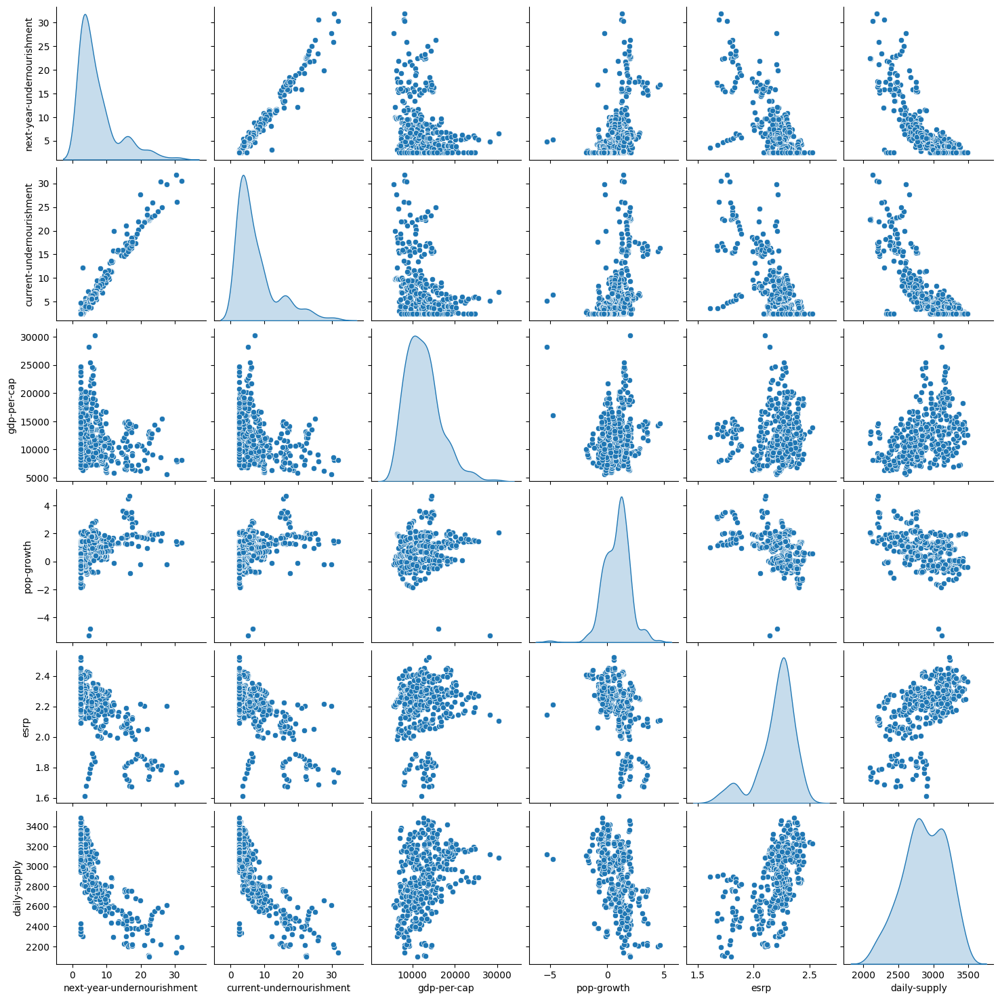

In [88]:
print('Figure 5: Pair plots of selected model features')
sns.pairplot(train_data[['next-year-undernourishment', 'current-undernourishment', 'gdp-per-cap', 'pop-growth', 'esrp', 'daily-supply']], diag_kind='kde')

An overview of the data’s statistical characteristics below revealed that the features have significantly different ranges, as indicated by their means and standard deviations. This variation necessitates normalization to ensure consistent scaling across all features.

In [90]:
train_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
next-year-undernourishment,417.0,7.226859,5.789874,2.500000,2.800000,5.200000,8.900000,31.900000
current-undernourishment,417.0,7.518225,6.048530,2.500000,3.000000,5.300000,9.200000,31.900000
gdp-per-cap,417.0,12467.261337,4088.974273,5589.568508,9436.793945,11994.938196,14590.780112,30261.340794
pop-growth,417.0,0.864394,1.119820,-5.280078,0.105042,1.040241,1.504735,4.665419
esrp,417.0,2.204087,0.168735,1.611480,2.146864,2.248048,2.304303,2.524373
daily-supply,417.0,2873.786180,308.074538,2094.902000,2666.995000,2872.790000,3124.996600,3483.011200


### 7. Normalization

Normalizing features with different scales and ranges is essential for stable model training. This practice ensures that features, when multiplied by model weights, do not introduce scale-related disparities that can impact both the output values and gradient calculations.

In [92]:
normalizer = tf.keras.layers.Normalization(axis=-1)
normalizer.adapt(np.array(X_train))

In [94]:
print(normalizer.mean.numpy())

[[7.5182252e+00 1.2467262e+04 8.6439431e-01 2.2040865e+00 2.8737861e+03]]


In [96]:
first = np.array(X_train[:1])

with np.printoptions(precision=2, suppress=True):
    print('First example:', first)
    print('Normalized:', normalizer(first).numpy())

First example: [[   8.3  7284.89   -0.76    2.35 3042.5 ]]
Normalized: [[ 0.13 -1.27 -1.45  0.84  0.55]]


### 8. Model: Regression with a deep neural network (DNN)

In this step, a deep neural network model was constructed for regression, featuring four layers. The first layer is a normalization layer applied to the 5 input features, ensuring consistent scaling across inputs. This is followed by three dense layers with ReLU activation functions, enabling the model to capture complex relationships in the data. Model performance was evaluated at each epoch using mean absolute error (MAE).

To assess training performance, Figure 6 plots the training and validation loss across epochs, allowing us to observe how well the model generalizes over tim.


In [98]:
def build_and_compile_model(norm):
    model = keras.Sequential([
        norm,
        layers.Dense(32, activation='relu'),
        layers.Dense(16, activation='relu'),
        layers.Dense(1)
        ])
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(0.001))
    return model

def plot_loss(history):
    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.ylim([0, 10])
    plt.xlabel('Epoch')
    plt.ylabel('Error [undernourishment rate]')
    plt.legend()
    plt.grid(True)

In [141]:
dnn_model = build_and_compile_model(normalizer)

Figure 6: Training loss and validation loss
CPU times: total: 15 s
Wall time: 11.8 s


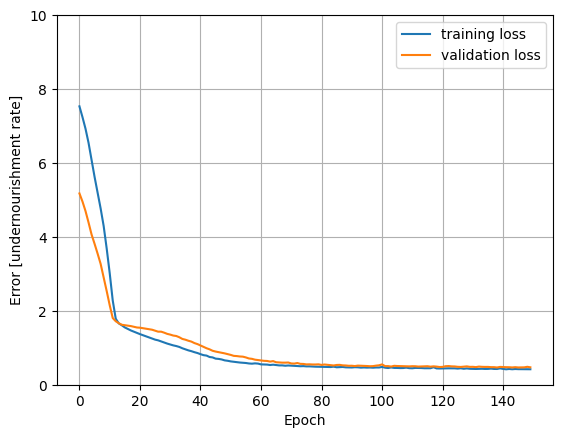

In [142]:
%%time
history = dnn_model.fit(
    X_train,
    Y_train,
    validation_split=0.2,
    verbose=0, epochs=150)

print('Figure 6: Training loss and validation loss')
plot_loss(history)

In [144]:
dnn_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ normalization (Normalization)        │ (None, 5)                   │              11 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 32)                  │             192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,224 (8.70 KB)

 Trainable params: 737 (2.88 KB)

 Non-trainable params: 11 (48.00 B)

 Optimizer params: 1,476 (5.77 KB)

### 9. Make predictions

Using the trained model, predictions were made on the test set. The results are presented in Figure 7, which compares the true values with the predicted values. It appears that the model predicts reasonably well.

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Figure 7: Comparison between true values and predicted values


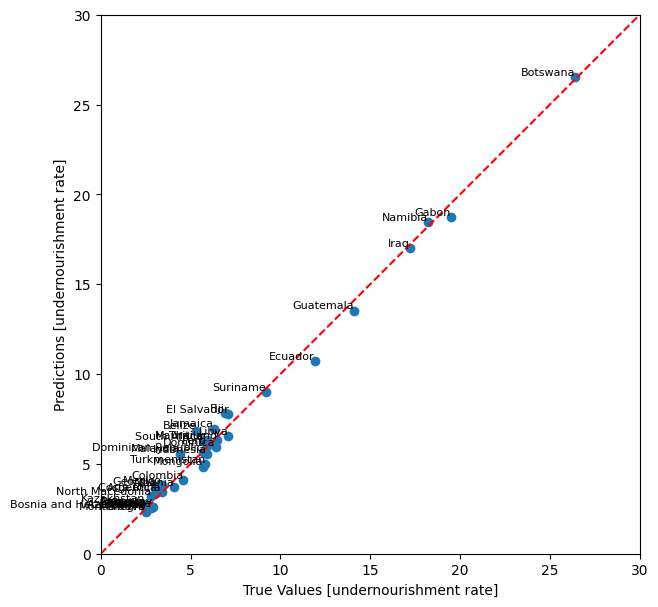

In [147]:
def plot_prediction():
    # Set figure size
    plt.figure(figsize=(7, 7))
    # Generate predictions and flatten the array if necessary
    Y_predicted = dnn_model.predict(X_test).flatten()
    # Plot scatter plot
    a = plt.axes(aspect='equal')
    plt.scatter(Y_test, Y_predicted)
    plt.xlabel('True Values [undernourishment rate]')
    plt.ylabel('Predictions [undernourishment rate]')
    # Set plot limits
    lims = [0, 30]
    plt.xlim(lims)
    plt.ylim(lims)
    plt.plot(lims, lims, color='red', linestyle='--')
    # Label each point with the index of Y_test
    for i, (true_val, pred_val) in enumerate(zip(Y_test, Y_predicted)):
        plt.text(true_val, pred_val, Y_test.index[i][0], fontsize=8, ha='right', va='bottom')
    print('Figure 7: Comparison between true values and predicted values')
    plt.show()
plot_prediction()

### 10. Evaluation

To assess the model’s accuracy, the mean absolute error (MAE) was calculated, and an error histogram (Figure 8) was plotted to visualize the distribution of prediction errors. The histogram shows that most errors cluster around zero, indicating that the predictions are generally accurate.

In [149]:
# Collect the results on the test set:
test_results = dnn_model.evaluate(X_test, Y_test, verbose=0)
print("Mean absolute error: ",test_results)

Mean absolute error:  0.40039244294166565


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Figure 8: Error histogram


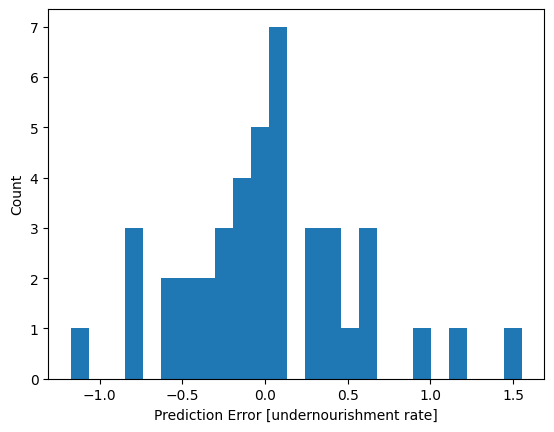

In [151]:
# Check the error distribution
Y_predicted = dnn_model.predict(X_test).flatten()
error = Y_predicted - Y_test
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [undernourishment rate]')
_ = plt.ylabel('Count')
print('Figure 8: Error histogram')

### 11. Save the model

The model can be saved and re-loaded to future usage.

In [153]:
dnn_model.save('dnn_model.keras')

<br><br><br>

## Discussion

After comparing the test result and the actual value from the test data, we found that the model we created to be quite accurate. The most likely cause of this is due to the use of several high-quality indicators that show very high correlation with undernourishment rate. This is also supported by the availability of extensive and complete data. If we were to use different indicators that show low-correlation or insufficient data availability, then the result would likely have been very different.

We can also conclude that the 5 factors used in the analysis–the prevalence of undernourishment rate, GDP per capita, Economic and Social Right Performance Score, and daily supply per capita–affect the rate of undernourishment significantly. Each indicator has a clear causality towards undernourishment rate. For example, food allowance and assistance is one of the major indicators used to calculate the Economic and Social Right Performance Score (ESRP). This means an increase in ESRP score will also increase the food allowance, which results in lower undernourishment rate. Assuming the indicators used in the model maintain their high    correlation with undernourishment rate, the model will likely be able to sufficiently predict future undernourishment rates.

However, there are some limitations in this analysis. One of them is the lack of data in some indicators that show even higher correlation than the 5 indicators we used for the model. For example, the indicator of ‘share income held by highest 10%’ and ‘share of income held by lowest 20%’ show a very high correlation with undernourishment rate, but we could not use this due to the data being incomplete.

Even though the model did a pretty good job with only 0.40 % MAE in predicting prevalence of undernourishment. There is still a limitation in the lack of reasoning and understanding behind the machine learning model. We decided which indicators to use based on the strength of its correlation with the undernourishment rate. However, once we step into the machine-learning part, it is quite difficult to see how the model actually comes up with this result. In the future analysis, it is important to back up the results of the model with external references, such as research papers.

A primary technical limitation of developing this model is time constraints. Building a robust machine learning model typically requires extensive hyperparameter tuning, a process crucial for optimizing model performance. Key parameters—such as the number of dense layers, the number of nodes per layer, the activation functions, the evaluation metric, and even the type of neural network—must be fine-tuned and optimized to achieve the best results.

Additionally, to enhance the model’s reliability, these factors must be carefully considered. The model would also benefit from more data; for time series predictions, incorporating more lagged data points could significantly improve accuracy.


<br><br><br>

## Conclusion

Throughout this report, we have analyzed socioeconomic data from multiple sources to explore factors contributing to undernourishment. Our findings indicate that the impact of undernourishment and its contributing factors vary significantly across income levels, underscoring the complex dynamics at play in different economic contexts. Furthermore, our attempt to develop a machine learning model using these factors presents a valuable opportunity for countries—particularly those in the upper-middle-income group (UMC)—to better understand and anticipate challenges related to citizen well-being. This approach offers a foundation for informed decision-making and the development of targeted aid policies to support sustainable progress toward the “Zero Hunger” objective of SDG 2.

<br><br><br>

## References

- Alao, R., Nur, H., Fivian, E., Shankar, B., Kadiyala, S., & Harris-Fry, H. (2021). Economic inequality in malnutrition: a global systematic review and meta-analysis. BMJ Global Health, 6(12). https://doi.org/10.1136/bmjgh-2021-006906
- Daily supply of calories per person. (2023). Our World in Data. https://ourworldindata.org/grapher/daily-per-capita-caloric-supply
- Eini-Zinab, H., Edalati, S., Sobhani, S. R., Kezabi, M. F., & Hosseini, S. (2020). Undernourishment trends and determinants: an ecological study of 76 countries. Public Health, 186, 230–239. https://doi.org/10.1016/j.puhe.2020.07.013
- NHS.(n.d.).NHSchoices. https://www.nhs.uk/live-well/healthy-weight/managing-your-weight/understanding-calories/ 
- Randolph, S., Fukuda-Parr, S., & Lawson-Remer, T. (2010). Economic and Social Rights Fulfillment Index: Country Scores and Rankings. Journal of Human Rights, 9(3), 230–261. https://doi.org/10.1080/14754835.2010.501257
- Shahane, A. A., & Shivay, Y. S. (2024). Cereal crops: A valid option for bio-fortification and development of nutrient-dense food in developing and developed countries in Asia and Africa. Advances in Agronomy, 205–276. https://doi.org/10.1016/bs.agron.2024.02.010
- World Bank Open Data. (n.d.). World Bank Open Data. https://data.worldbank.org/indicator
